##Tiny NeRF
This is a simplied version of the method presented in *NeRF: Representing Scenes as Neural Radiance Fields for View Synthesis*

[Project Website](http://www.matthewtancik.com/nerf)

[arXiv Paper](https://arxiv.org/abs/2003.08934)

[Full Code](github.com/bmild/nerf)

Components not included in the notebook
*   5D input including view directions
*   Hierarchical Sampling



NeRF 볼룸렌더링 원리
- 샘플들이 빛이 지나가는 순선대로 존재, 각각의 샘플까지 도달하는 '투과율'을 누적곱 형태로 계산(자기자신 불포함)
- 배타적 누적곱 사용(exclusive cumulative product)  

In [1]:
import os, sys         # 시스템/환경 설정
import torch            # 딥러닝 핵심 라이브러리
from tqdm import tqdm   # 진행률 표시 (프로그레스 바)
import numpy as np      # 배열 및 수치 연산
import matplotlib.pyplot as plt  # 데이터 시각화

In [2]:
if not os.path.exists('tiny_nerf_data.npz'):
    !wget http://cseweb.ucsd.edu/~viscomp/projects/LF/papers/ECCV20/nerf/tiny_nerf_data.npz

--2026-02-12 14:13:01--  http://cseweb.ucsd.edu/~viscomp/projects/LF/papers/ECCV20/nerf/tiny_nerf_data.npz
Resolving cseweb.ucsd.edu (cseweb.ucsd.edu)... 132.239.8.30
Connecting to cseweb.ucsd.edu (cseweb.ucsd.edu)|132.239.8.30|:80... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://cseweb.ucsd.edu//~viscomp/projects/LF/papers/ECCV20/nerf/tiny_nerf_data.npz [following]
--2026-02-12 14:13:02--  https://cseweb.ucsd.edu//~viscomp/projects/LF/papers/ECCV20/nerf/tiny_nerf_data.npz
Connecting to cseweb.ucsd.edu (cseweb.ucsd.edu)|132.239.8.30|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 12727482 (12M)
Saving to: ‘tiny_nerf_data.npz’

tiny_nerf_data.npz  100%[===================>]  12.14M  4.50MB/s    in 2.7s    

2026-02-12 14:13:06 (4.50 MB/s) - ‘tiny_nerf_data.npz’ saved [12727482/12727482]



# Load Input Images and Poses

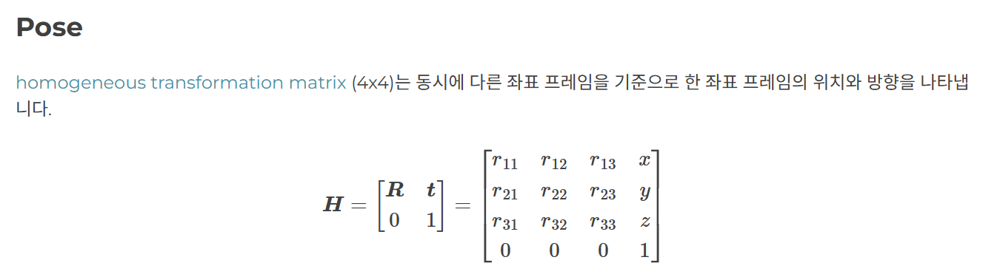

In [3]:
data = np.load('tiny_nerf_data.npz') # NeRF 학습에 필요한 데이터를 NumPy 파일에서 로드
images = data['images']              # RGB 이미지 데이터 (N, H, W, 3)
poses = data['poses']                # 각 이미지에 대한 카메라 포즈 행렬 (N, 4, 4)
focal = data['focal']                # 카메라의 초점 거리 (f)

In [5]:
print(images.shape)
print(poses.shape)
print(focal.shape)

(106, 100, 100, 3)
(106, 4, 4)
()


(106, 100, 100, 3) (106, 4, 4) 138.88887889922103
[[ 6.8935126e-01  5.3373039e-01 -4.8982298e-01 -1.9745398e+00]
 [-7.2442728e-01  5.0788772e-01 -4.6610624e-01 -1.8789345e+00]
 [ 1.4901163e-08  6.7615211e-01  7.3676193e-01  2.9699826e+00]
 [ 0.0000000e+00  0.0000000e+00  0.0000000e+00  1.0000000e+00]]


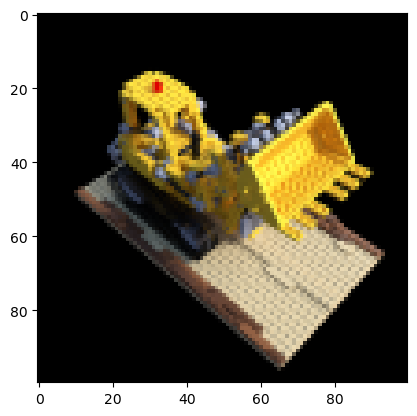

In [10]:
data = np.load('tiny_nerf_data.npz') # NeRF 학습에 필요한 데이터를 NumPy 파일에서 로드
images = data['images']              # RGB 이미지 데이터 (N, H, W, 3)
poses = data['poses']                # 각 이미지에 대한 카메라 포즈 행렬 (N, 4, 4)
focal = data['focal']                # 카메라의 초점 거리 (f)
H, W = images.shape[1:3]             # 이미지의 높이(H)와 너비(W) 추출
print(images.shape, poses.shape, focal) # 로드된 데이터의 형태와 초점 거리 출력 (디버깅/확인용)

# --- 학습 및 테스트 데이터 분리 ---
testimg, testpose = images[101], poses[101] # 102번째 이미지와 포즈를 렌더링 테스트용으로 분리
images = images[:100,...,:3]        # 처음 100개의 이미지를 학습 데이터로 사용 (알파 채널이 있다면 제거하고 RGB만 사용)
# 이미지 데이터 형태 (height, width, channel, 투명도) 
poses = poses[:100]                  # 처음 100개의 포즈를 학습 데이터로 사용


# --- 테스트 이미지 시각화 ---
print(testpose)
plt.imshow(testimg)                  # 분리된 테스트 이미지를 Matplotlib으로 화면에 표시
plt.show()                           # 이미지 출력

# 결과 해석
# (106, 100, 100, 3) 106장, 100*100 px, 컬러사진(rgb 3채널)
# (사진개수, 높이, 너비, 색상채널(RGB))
# poses? 각 사진을 찍을 때 카메라 어디에 있었는지 기록
# (106, 4, 4)
# 4*4 행렬(pose matrix)로 3d 공간에서 위치, 방향 표현
# >> 위치, 방향, 변환 정보를 담고 있는 16개의 숫자 정보
# >> 회전, 위치, 이동을 동시에 표현하기 위한 행렬
# 1-9 : 회전(카메라가 어떤 방향을 보고 있나), 10-12(x,y,z), 13-15(항등 좌표계 유지용 값 0,0,0)
# 16 : 항상 1
# focal: 카메라 렌즈 특성, 숫자가 클수록 망원렌즈처럼 확대

# Optimize NeRF

In [ ]:
# PyTorch를 실행할 장치(Device)를 설정.
# 'CUDA' (NVIDIA GPU)가 사용 가능하다면 GPU를 사용하고, 아니면 'CPU'를 사용하도록 설정하여 연산 가속화.
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# PyTorch 텐서의 기본 자료형(Default Data Type)을 32비트 부동 소수점(float32)으로 설정.
# 이는 대부분의 딥러닝 모델에서 표준으로 사용되는 정밀도입니다.
torch.set_default_dtype(torch.float32)

# NeRF 모델에서 사용되는 위치 인코딩(Positional Encoding)의 하이퍼파라미터 L 설정.
# 입력 좌표(x, y, z)를 더 높은 차원으로 매핑하는 데 사용되는 주파수 대역의 수입니다.
# L=6은 NeRF의 세부적인 기하학적 구조를 캡처하는 데 중요한 역할을 합니다.
L_embed = 6

# 위치 인코딩(positional encoding) 함수 (3D 좌표)
# 입력 (x,y,z) 3차원
# 3(차원) x 6(L) x 2(sin,cos) = 36차원 벡터 and 방향(x,y,z) => 39차원
# 출력 (x,y,z) 3차원 + 60차원(주파수 변환)  >> 63차원 벡터

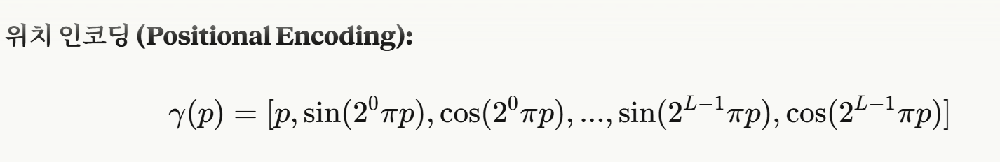

In [ ]:
class NeRF(torch.nn.Module):
    """
    NeRF MLP model  # NeRF의 신경 방사 필드(NeRF)를 구현하는 MLP 모델 클래스
    """
    def __init__(self, filter_size=128, L_embed=6):
        super(NeRF, self).__init__()
        # 입력 레이어: (3차원 좌표 + 위치 인코딩된 좌표)를 입력으로 받음.
        # 입력 차원: 3 (원본 xyz) + 3 * 2 * L_embed (인코딩된 sin/cos 쌍)
        self.layer1 = torch.nn.Linear(3 + 3*2*L_embed, filter_size)
        self.layer2 = torch.nn.Linear(filter_size, filter_size)
        # 출력 레이어: 4차원 (RGB 색상 3차원 + Volume Density(부피 밀도) 1차원)
        self.layer3 = torch.nn.Linear(filter_size, 4)
        self.relu = torch.nn.functional.relu # 활성화 함수로 ReLU 사용

    def forward(self, x):
        # 3개의 선형 레이어와 2개의 ReLU를 통과하는 순전파 로직
        x = self.relu(self.layer1(x))
        x = self.relu(self.layer2(x))
        x = self.layer3(x) # 마지막 출력 레이어는 활성화 함수를 적용하지 않음
        # 밀도는
        # 색상은 [0,1] 나중에 시그모이드 함수 통과
        return x


def posenc(x):
    """
    Positional encoding  # 위치 정보에 고주파 정보를 추가하는 함수 (NeRF의 핵심)
    """
    rets = [x] # 원본 좌표(x, y, z)를 결과 리스트에 추가
    # L_embed 만큼의 주파수 대역에 대해 sin과 cos 함수를 적용하여 고차원 벡터 생성
    for i in range(L_embed):
        for fn in [torch.sin, torch.cos]:
            rets.append(fn(2.0 ** i * x)) # 2^i 주파수로 변환하여 리스트에 추가
    return torch.cat(rets, dim=-1) # 모든 결과를 마지막 차원(-1)으로 연결하여 반환

# 함수 결과물? 주파수가 2배씩 증가>> 다양한 스케일의 패턴 포착

embed_fn = posenc # 위치 인코딩 함수에 별칭을 부여하여 이후 사용 편의성 확보

# 왜 주파수(frequency)인가?
# sin, cos >> 파동(1초에 몇 번 흔들리는가, 진동수)
# sin(x) : 낮은 주파수 (천천히 흔들림) cf.sin(16x) 높은 주파수 매우 심하게 (빠르게) 흔들림
# 낮은 주파수: 전체인 구조 파악, 높은 주파수: 디테일 (테두리, 모서리(엣지), 질감)

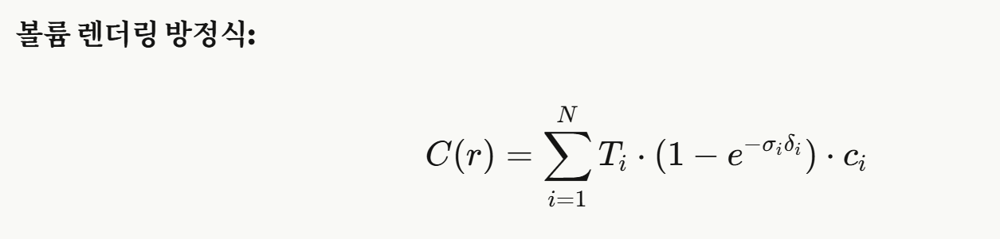

In [17]:
tensor1 = torch.tensor([1,2,3])
tensor2 = torch.tensor([1,2,3,4])
i, j = torch.meshgrid(tensor1, tensor2, indexing="ij")
i,j

(tensor([[1, 1, 1, 1],
         [2, 2, 2, 2],
         [3, 3, 3, 3]]),
 tensor([[1, 2, 3, 4],
         [1, 2, 3, 4],
         [1, 2, 3, 4]]))

In [18]:
i.transpose(-1, -2), j.transpose(-1, -2)

(tensor([[1, 2, 3],
         [1, 2, 3],
         [1, 2, 3],
         [1, 2, 3]]),
 tensor([[1, 1, 1],
         [2, 2, 2],
         [3, 3, 3],
         [4, 4, 4]]))

In [20]:
tensor1

tensor([1, 2, 3])

In [23]:
_ = torch.cumprod(tensor1, dim=-1)
print(_)
torch.roll(_, 1, dims=-1)

tensor([1, 2, 6])


tensor([6, 1, 2])

In [ ]:
def posenc(x):
    """
    Positional encoding  # 위치 정보에 고주파 정보를 추가하는 함수 (L_embed는 전역 변수로 가정)
    """
    rets = [x] # 원본 좌표(x, y, z)
    # L_embed 주파수 대역에 대해 sin/cos을 적용하여 고차원 벡터 생성
    for i in range(L_embed):
        for fn in [torch.sin, torch.cos]:
            rets.append(fn(2.0 ** i * x))
    return torch.cat(rets, dim=-1) # 결과들을 연결하여 반환

embed_fn = posenc # 위치 인코딩 함수 정의

def get_rays(H, W, focal, c2w): # 월드 좌표계에서의 레이 원점과 방향 반환
    """
    Get ray origin, direction to each image pixels based on camera pose
    # 카메라 포즈(c2w: camera to world)를 기반으로 모든 픽셀에 대한 레이의 원점과 방향을 계산
    # 카메라에서 각 픽셀로 광선을 발사하는 함수

    볼룸 렌더링: 광선을 따라 색상을 적분하여 최종 픽셀 색상 계산

    과정:
    1. 광선을 따라 샘플 포인트 생성
    2. 각 포인트에서 색상과 밀도 예측
    3. 볼륨 렌더링 공식으로 최종 색상 계산

    """
    def meshgrid_xy(tensor1, tensor2):
        # PyTorch의 meshgrid 결과를 Numpy/TensorFlow와 호환되도록 재배치
        i, j = torch.meshgrid(tensor1, tensor2, indexing="ij")
        return i.transpose(-1, -2), j.transpose(-1, -2)

    # 픽셀 좌표 (i, j) 생성
    i, j = meshgrid_xy(
        torch.arange(W, dtype=torch.float32).to(device),
        torch.arange(H, dtype=torch.float32).to(device)
    )
    # 카메라 좌표계(Camera Coordinates)에서의 레이 방향 벡터 계산 (광축: -z)
    dirs = torch.stack([(i-W*0.5)/focal, -(j-H*0.5)/focal, -torch.ones_like(i)], dim=-1).to(device)
    # 벡터의 크기를 1로 맞춰주는 경우도 있지만 현재는 1과 큰 차이가 없고 계산량 갑소를 위해
    # (i-W*0.5)/focal x 방향(중심 기준),  -(j-H*0.5)/focal y방향 (위가 음수), -torch.ones_like(i)] (카메라 앞쪽)
    # 레이 방향: 카메라 좌표를 월드 좌표로 변환 (회전 행렬 c2w[:3, :3] 사용)
    rays_d = torch.sum(dirs[..., None, :] * c2w[:3, :3], dim=-1) # 행렬 곱과 같은 의미임
    # 레이 원점(카메라 위치, 광선 시작점): 카메라 위치 (c2w[:3, -1])를 모든 레이 방향의 수만큼 확장
    rays_o = c2w[:3, -1].expand(rays_d.shape)
    return rays_o, rays_d # 월드 좌표계에서의 레이 원점과 방향 반환

def render_rays(network_fn, rays_o, rays_d, near, far, N_samples, rand=False):
    """
    Volume rendering # NeRF 모델을 사용하여 샘플링된 점들을 따라 볼륨 렌더링을 수행
    """
    def batchify(fn, chunk=1024*32):
        # 메모리 효율을 위해 대량의 입력을 청크(chunk)로 나누어 MLP를 호출
        # fn: 실제 계산할 함수(mlp), chunk(한 번에 처리할 최대 입력 수) = 32768
        return lambda inputs : torch.cat([fn(inputs[i:i+chunk]) for i in range(0, inputs.shape[0], chunk)], dim=0)
        # inputs 100,000개
        # 1번째 : inputs[0: 32768]
        # 2번째 : inputs[32768:65536]
        # 3번째 : inputs[65536:98304]
        # 4번째: inputs[98304:100,000]
        # 이렇게 4번째 잘라서 fn(mlp) 넣는다
        # 최종 결과물은 원래 입력길이와 동일한 구조로 복원

    def exclusive_cumprod(tensor):
        # 누적 곱을 계산한 뒤 한 칸 오른쪽으로 시프트하여 T_i (투과율) 계산에 사용
        # 배타적 누적 곱 : i 번째 위치의 값은 자기 자신을 곱하지 않은 이전 값들의 누적 곱임
        cumprod = torch.cumprod(tensor, dim=-1)
        cumprod = torch.roll(cumprod, 1, dims=-1)
        cumprod[..., 0] = 1.0 # 첫 번째 값은 1.0으로 설정 (첫 번째 샘플까지의 투과율)
        return cumprod
        # T_i (투과율) i번째 이전 값들의 누적 곱만 포함하고 , 자기자신 alpha_i(샘플의 불투명도)포함
        # 즉, 각 샘플의 투과율 (T_i) 자기 이전의 샘플들만 누적

    # --- 3D 쿼리 점 계산 (Sample 3D Points) ---
    z_vals = torch.linspace(near, far, N_samples).to(device) # 레이를 따라 균일하게 깊이 값(z) 생성
    if rand:
        # 훈련 시 정규화를 방지하기 위해 랜덤한 오프셋 추가 (Hierarchical Sampling 이전 단계)
        z_vals = z_vals + torch.rand(list(rays_o.shape[:-1]) + [N_samples]).to(device) * (far-near)/N_samples
        # rand() : 0-1 난수
        # rays_o.shape = (1024, 3) >> [:-1] >> (1024, ) >> (1024,N_samples)
        # ray(광선)마다 n개 난수 생성
        # (far-near) 전체 구간, (far-near)/N_samples : 각 샘플당 차지하는 구간 >> 각 샘플 간 간격

    # 3D 점 좌표 계산: pts = o + t * d (레이 원점 + 깊이 * 레이 방향)
    # 카메라 쏜 광선을 따라가면서 z_vals 깊이에 해당하는 3d 점들 생성
    pts = rays_o[..., None, :] + rays_d[..., None, :] * z_vals[..., :, None]
    # 해당 공간의 3d 점 = 카메라 위치 + (거리 *방향)
    # rays_o[..., None, :] (h,w,c) >> (h,w,3) >> (N-rays, 3) >> (N-rays, 1, 3)
    # rays_d[..., None, :] rays_d : 각 광선의 1unit 당 direction(방향) 벡터 (길이 1 방향 벡터)
    # >> (N-rays, 1, 3)
    # z_vals[..., :, None] 깊이 샘플값(N_samples) (N_rays, N_samples, 1)
    # rays_d[..., None, :] * z_vals[..., :, None]
    # >> 각 ray(광선) 방향을 z(distance) 만큼 이동한 3d 좌표 변화량
    # rays_o[..., None, :] (n_rays, 1, 3)
    # z_vals[..., :, None] (n_rays, n_samples, 1)

    # --- NeRF MLP 실행 (Run Network) ---
    pts_flat = torch.reshape(pts, [-1, 3]) # 3D 점들을 평탄화하여 MLP 입력 형태로 만듦
    # (N_rays, N_samples, 3) >> (batch_size, 3)
    pts_flat = embed_fn(pts_flat) # 위치 인코딩 적용
    raw = batchify(network_fn)(pts_flat) # NeRF MLP를 청크 단위로 실행
    raw = torch.reshape(raw, list(pts.shape[:-1]) + [4])
    # 결과를 (레이 수, 샘플 수, 4) 형태로 복원
    # 4 가 뭐지? r, g, b, d (density: 밀도)
    # mlp 통과하면 (N_samples, 4)


    # --- Opacities and Color (색상 및 밀도 추출) ---
    sigma_a = torch.nn.functional.relu(raw[..., 3]) # 밀도는 relu 통과
    # raw[..., 3] 3: density (밀도=질량/부피) 밀도는 음수가 될 수 없어
    # relu 통과 시키면, 음수 >> 0 만들어 줌
    # 부피 밀도(sigma): ReLU를 적용하여 양수로 만듦

    rgb = torch.sigmoid(raw[..., :3]) # rgb는 sigmoid 통과
    # 색상(RGB): 시그모이드(Sigmoid)를 적용하여 [0, 1] 범위로 만듦
    # rgb [0,255] >> torch 형태 [0,1]

    # --- 볼륨 렌더링 공식 적용 (Perform Volume Rendering) ---
    # 인접 샘플 간의 거리 계산 (마지막은 무한대로 가정)
    dists = torch.cat([z_vals[..., 1:] - z_vals[..., :-1],
                       torch.tensor([1e10], device=device).expand(z_vals[..., :1].shape)], dim=-1)
    # z_vals : 광선(ray) 을 따라 샘플링한 깊이 값 (인접한 두 점의 차이 = 거리)
    # 투과율(T)과 밀도(sigma)를 사용하여 알파 값(가중치) 계산: alpha = 1 - exp(-sigma * delta)
    # 밀도 =질량 / 부피 >> 밀도가 높으면 빛이 더 많이 막힌다 >> alpha가 높아진다
    # 밀도가 0 >> 아무 것도 없다 >> alpha=0
    alpha = 1.0 - torch.exp(-sigma_a * dists)
    # 볼륨 렌더링 가중치 계산: weight = T * alpha
    # 누적 투과율 사용
    weights = alpha * exclusive_cumprod(1.0-alpha + 1e-10)
    # weights: (n_rays, n_samples)
    # 최종 색상 (RGB Map) 계산: C = sum(weight * color)
    # >> 볼륨 렌더린 된 최종 색상
    rgb_map = torch.sum(weights[..., None] * rgb, dim=-2)
    # rgb: (n_rays, n_samples,3)
    # 깊이 맵 (Depth Map) 계산: D = sum(weight * z_val)
    # 각 샘플 z 위치에 가중치를 곱한 뒤 합해주는 거네
    # >> 빛이 많이 닿는 위치일 수록 깊이에 반영되겠네

    depth_map = torch.sum(weights * z_vals, dim=-1)
    # 누적 투과율 (Accumulation Map) 계산: Acc = sum(weight)
    acc_map = torch.sum(weights, dim=-1)
    # 누적 투과율 acc_map (전체 weights의 )
    # 투과율이 높으면 전체 값이 낮아짐

    return rgb_map, depth_map, acc_map # 최종 렌더링된 색상, 깊이, 누적 투과율 반환

In [26]:
test = np.array([
    [1,2,3],
    [1,2,3],
    [1,2,3],
])

In [29]:
test[...,None]

array([[[1],
        [2],
        [3]],

       [[1],
        [2],
        [3]],

       [[1],
        [2],
        [3]]])

Here we optimize the model. We plot a rendered holdout view and its PSNR every 50 iterations.

NeRF optimization start


  0%|          | 0/10000 [00:00<?, ?it/s]

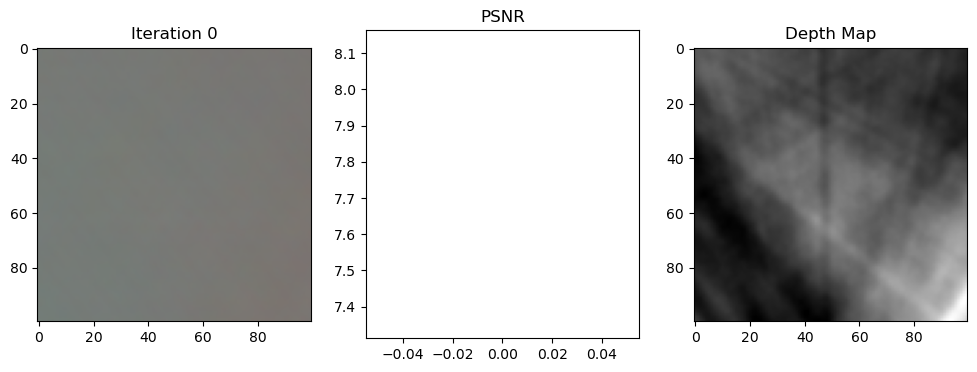

  1%|          | 97/10000 [00:04<04:43, 34.96it/s] 

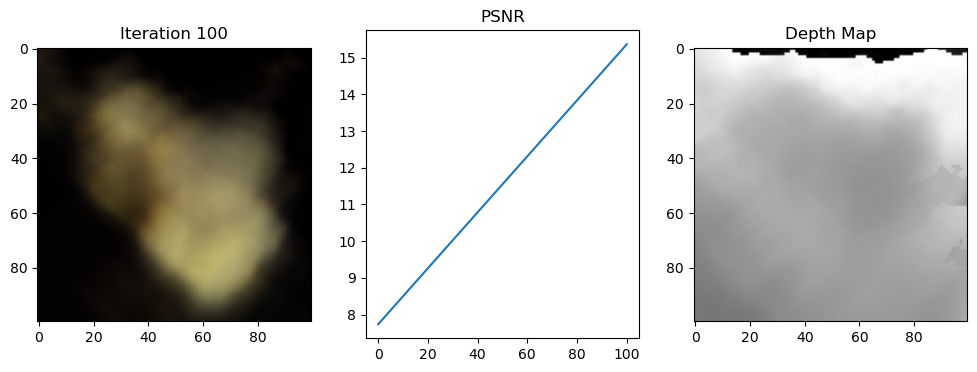

  2%|▏         | 197/10000 [00:08<04:40, 34.98it/s]

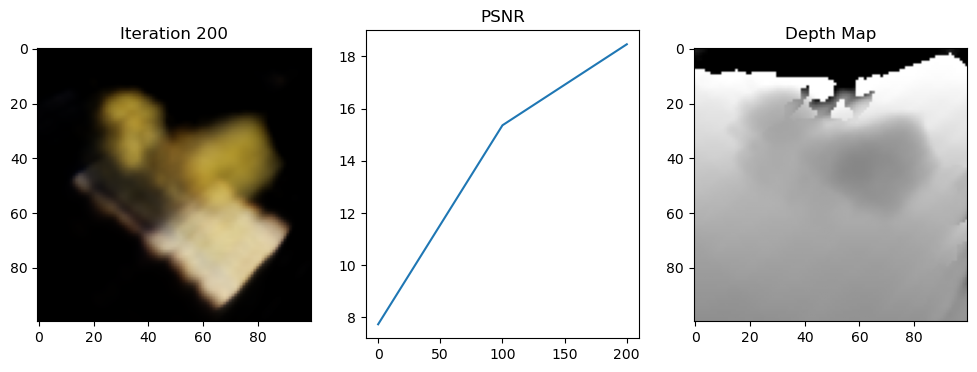

  3%|▎         | 297/10000 [00:12<04:36, 35.04it/s]

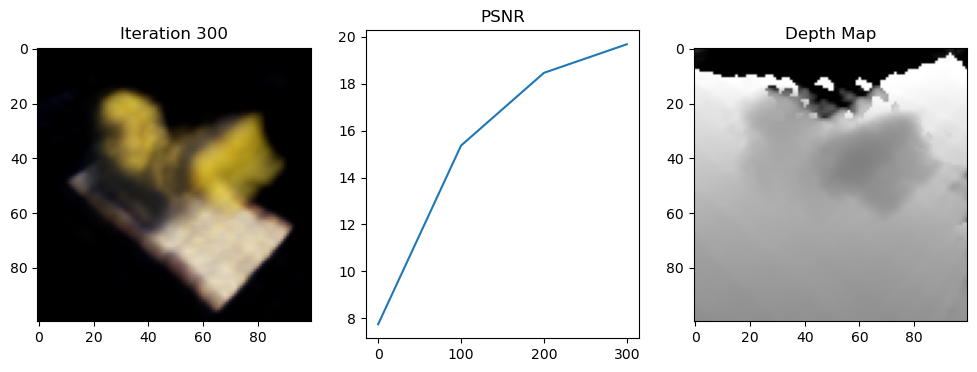

  4%|▍         | 397/10000 [00:16<04:34, 35.03it/s]

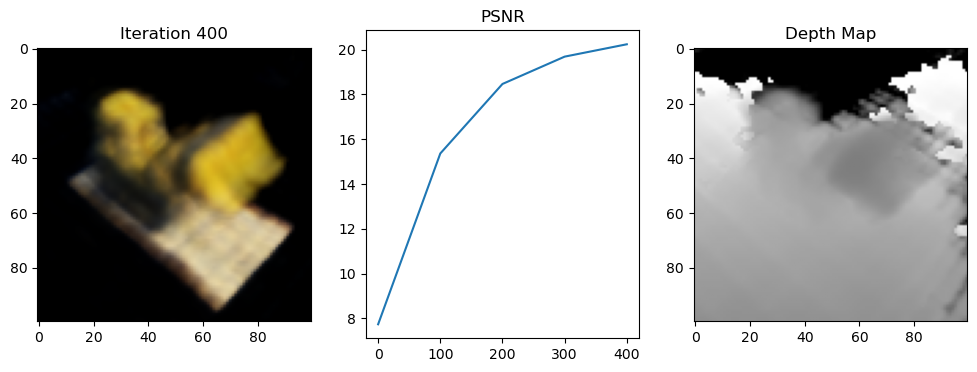

  5%|▍         | 497/10000 [00:20<04:30, 35.16it/s]

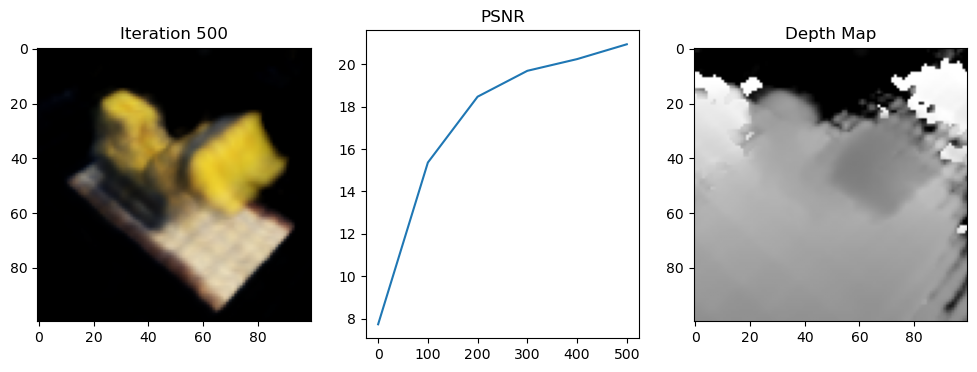

  6%|▌         | 597/10000 [00:24<04:28, 35.03it/s]

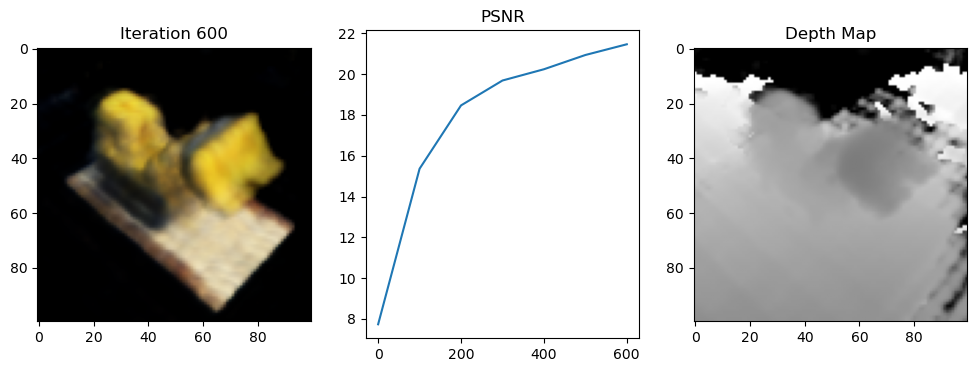

  7%|▋         | 697/10000 [00:28<04:25, 35.09it/s]

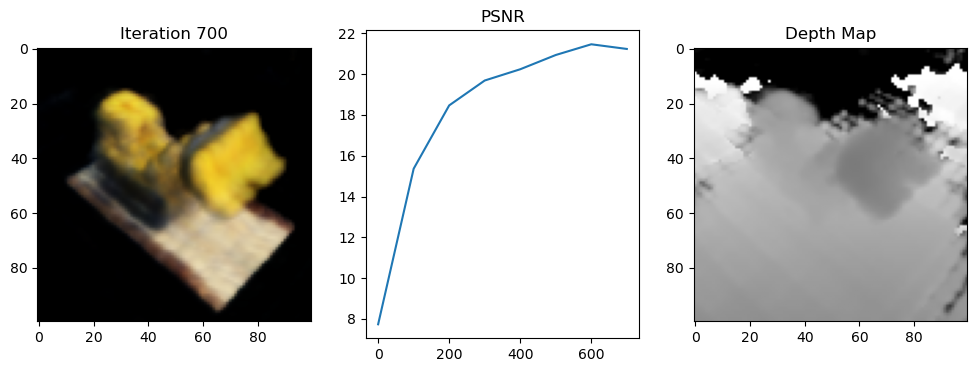

  8%|▊         | 797/10000 [00:32<04:22, 35.07it/s]

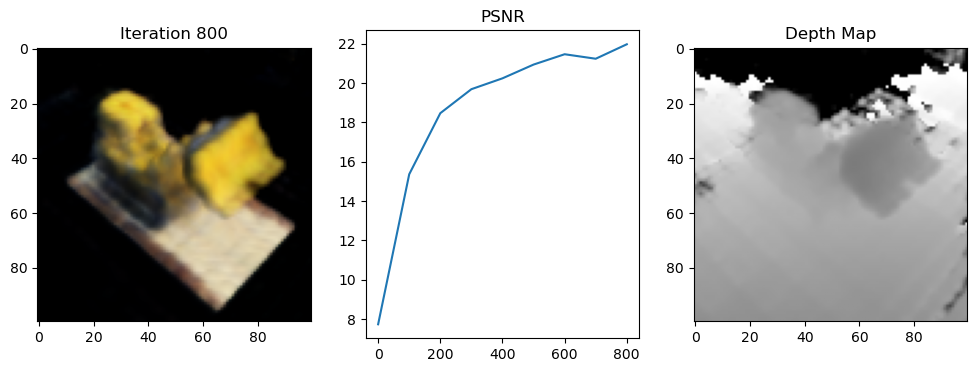

  9%|▉         | 897/10000 [00:36<04:18, 35.15it/s]

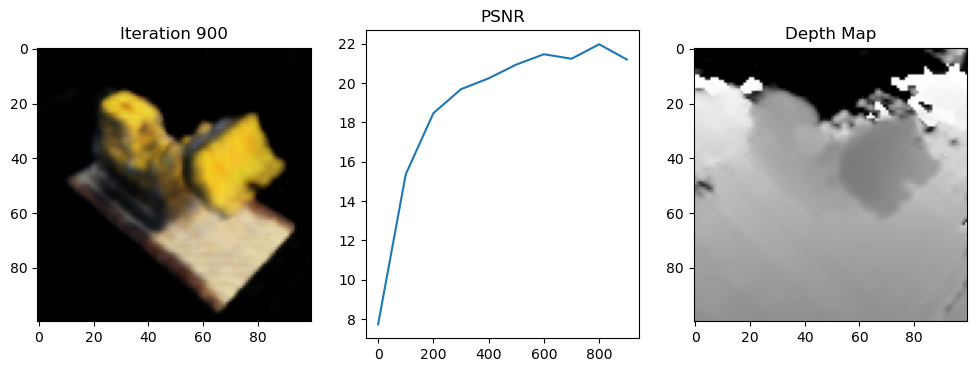

 10%|▉         | 997/10000 [00:40<04:17, 34.96it/s]

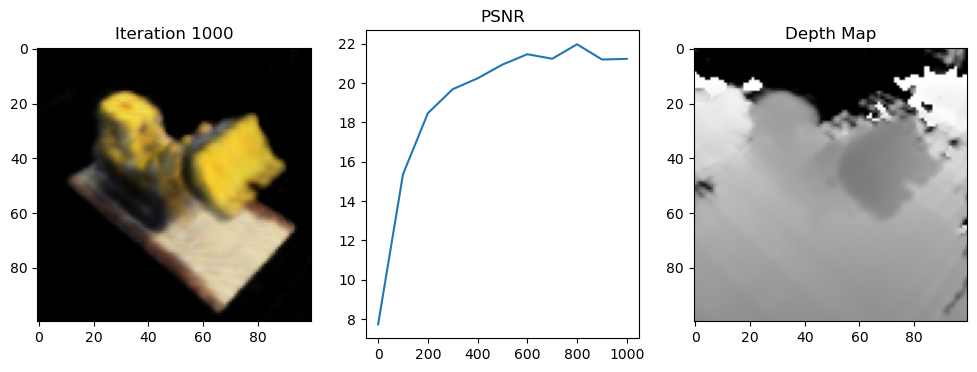

 11%|█         | 1097/10000 [00:44<04:13, 35.12it/s]

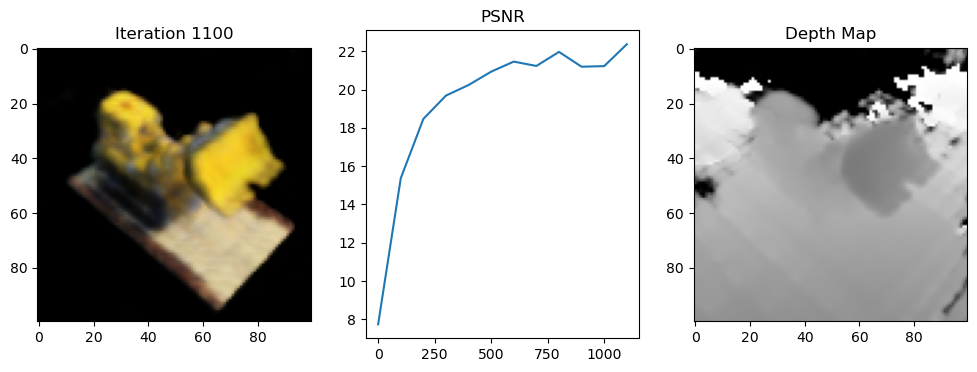

 12%|█▏        | 1197/10000 [00:48<04:10, 35.10it/s]

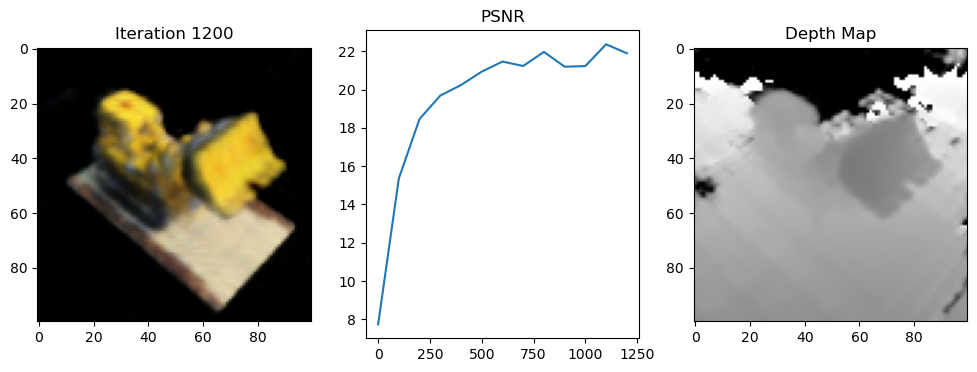

 13%|█▎        | 1297/10000 [00:52<04:07, 35.17it/s]

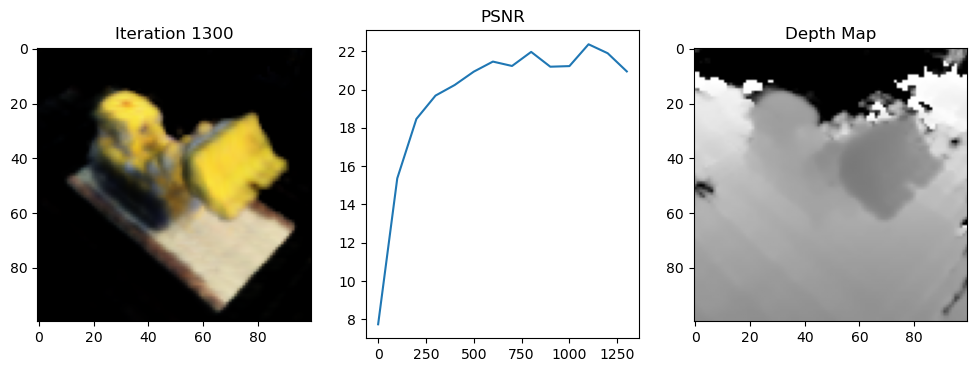

 14%|█▍        | 1397/10000 [00:56<04:04, 35.13it/s]

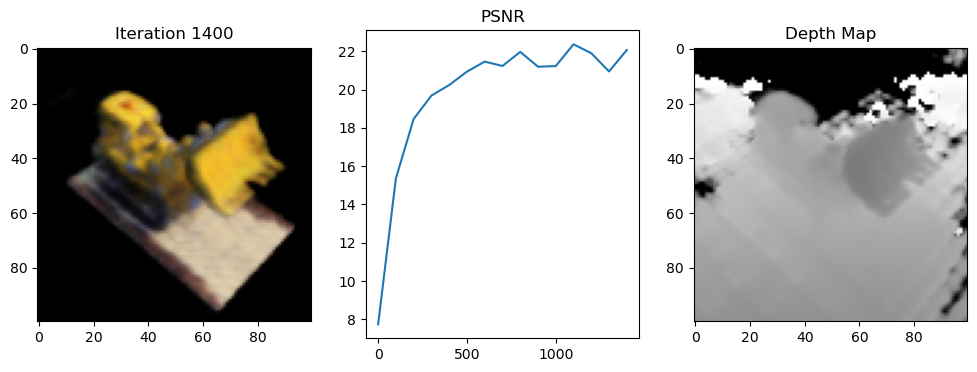

 15%|█▍        | 1497/10000 [01:00<04:01, 35.20it/s]

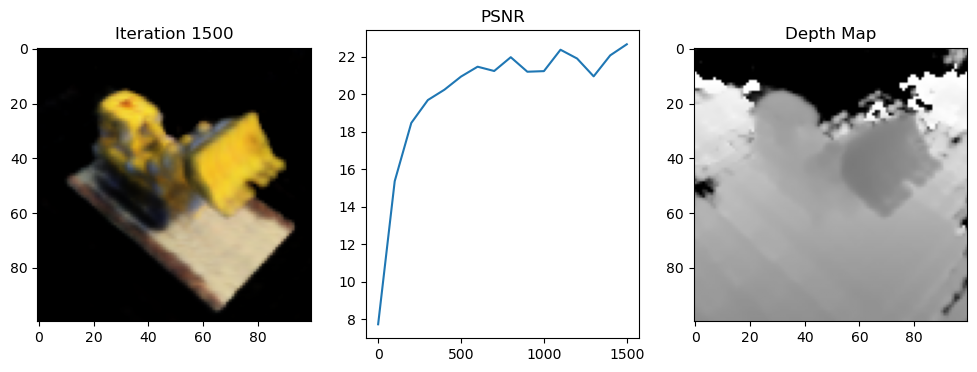

 16%|█▌        | 1597/10000 [01:04<03:59, 35.06it/s]

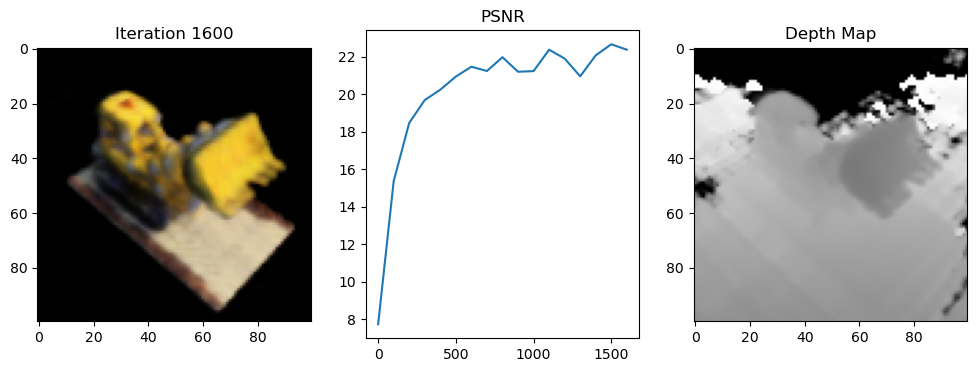

 17%|█▋        | 1697/10000 [01:08<03:56, 35.10it/s]

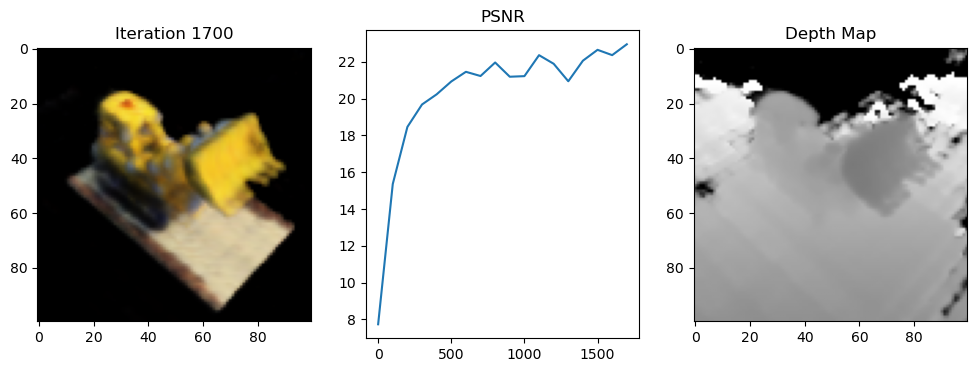

 18%|█▊        | 1797/10000 [01:12<03:54, 34.99it/s]

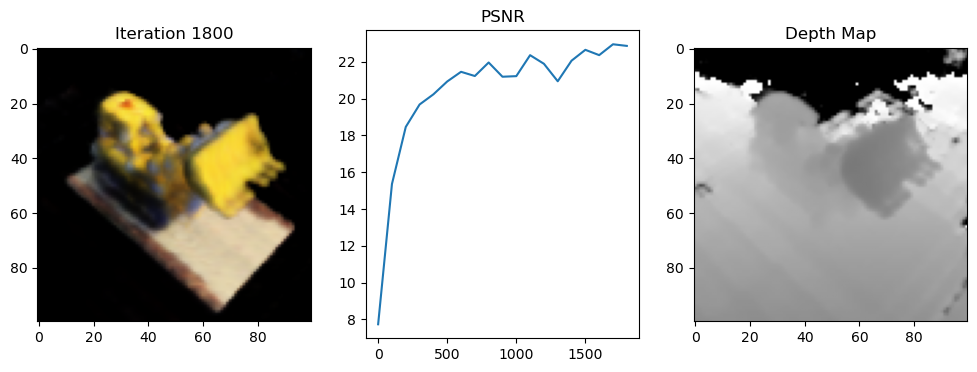

 19%|█▉        | 1897/10000 [01:16<03:50, 35.17it/s]

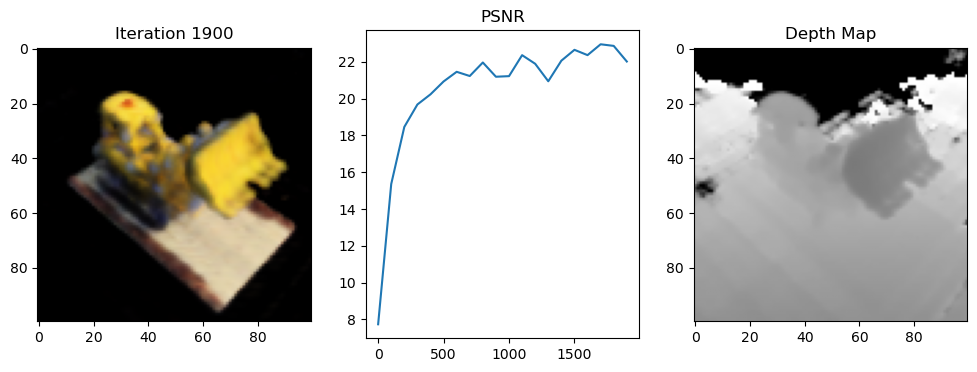

 20%|█▉        | 1997/10000 [01:20<03:48, 35.07it/s]

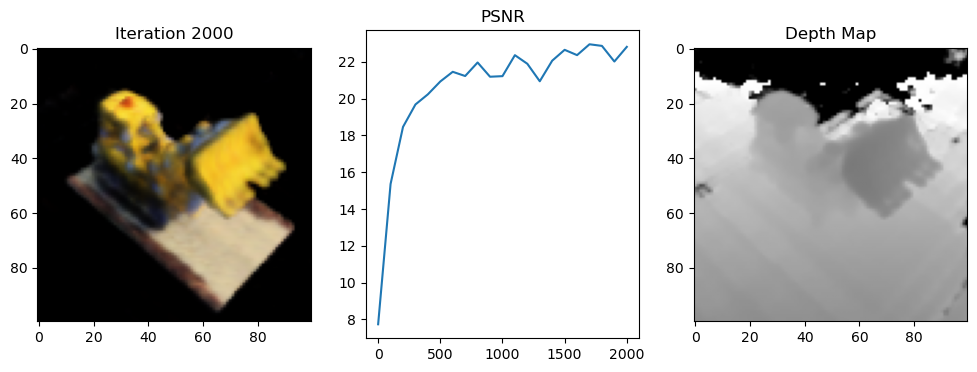

 21%|██        | 2097/10000 [01:24<03:44, 35.13it/s]

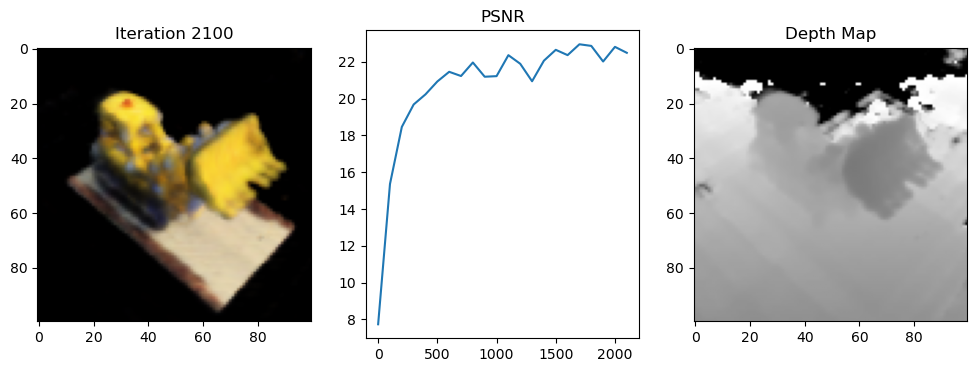

 22%|██▏       | 2197/10000 [01:27<03:42, 35.02it/s]

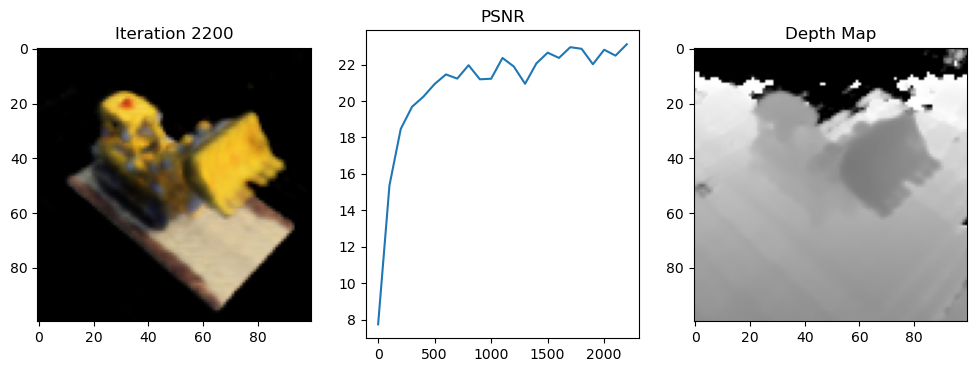

 23%|██▎       | 2297/10000 [01:31<03:40, 34.99it/s]

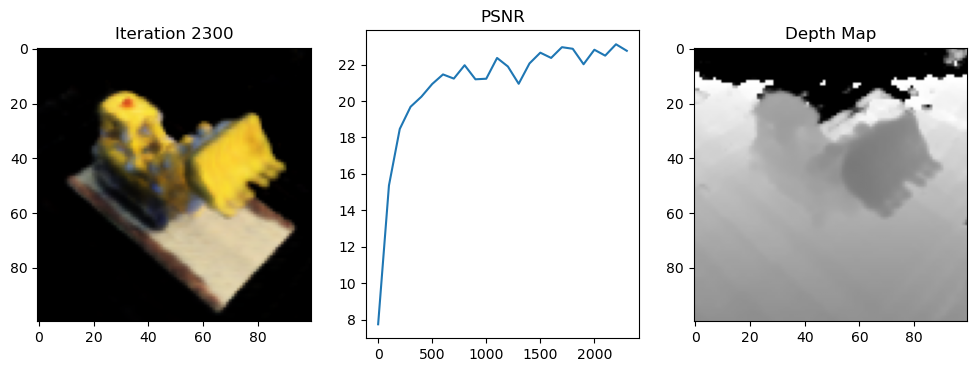

 24%|██▍       | 2397/10000 [01:36<03:38, 34.77it/s]

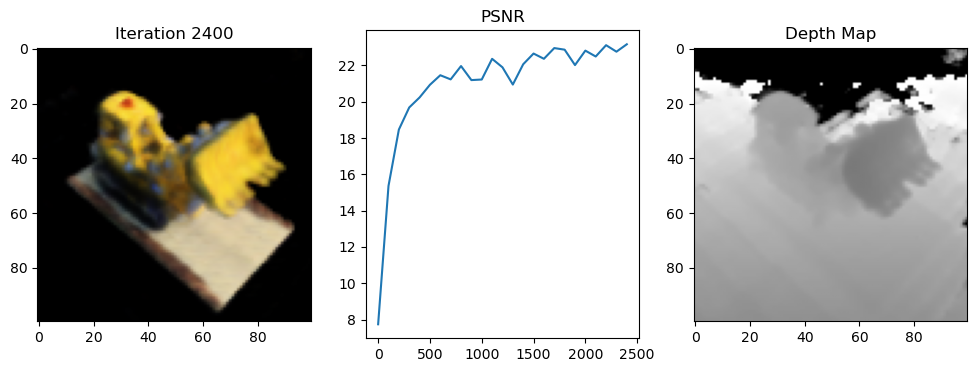

 25%|██▍       | 2497/10000 [01:40<03:35, 34.85it/s]

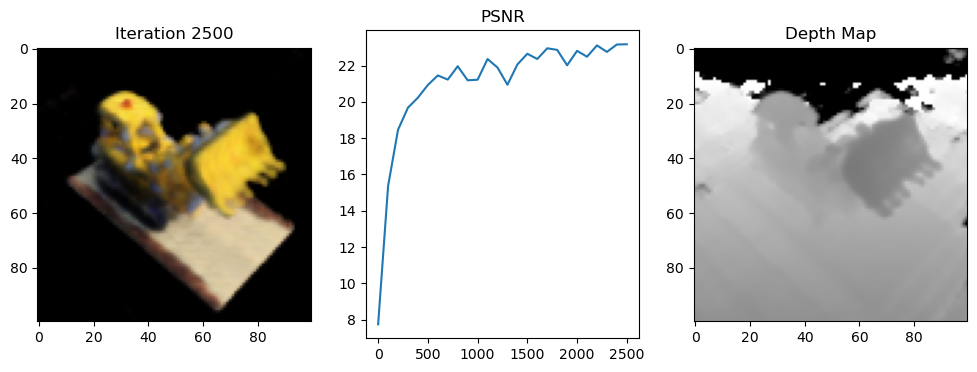

 26%|██▌       | 2597/10000 [01:44<03:31, 35.02it/s]

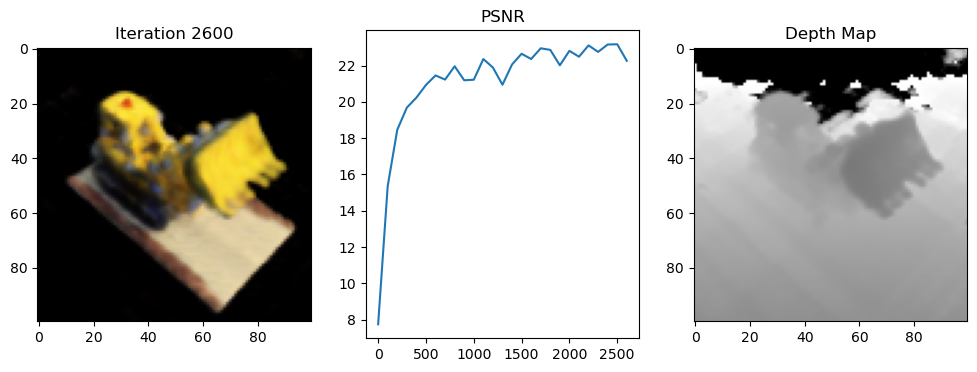

 27%|██▋       | 2697/10000 [01:48<03:31, 34.55it/s]

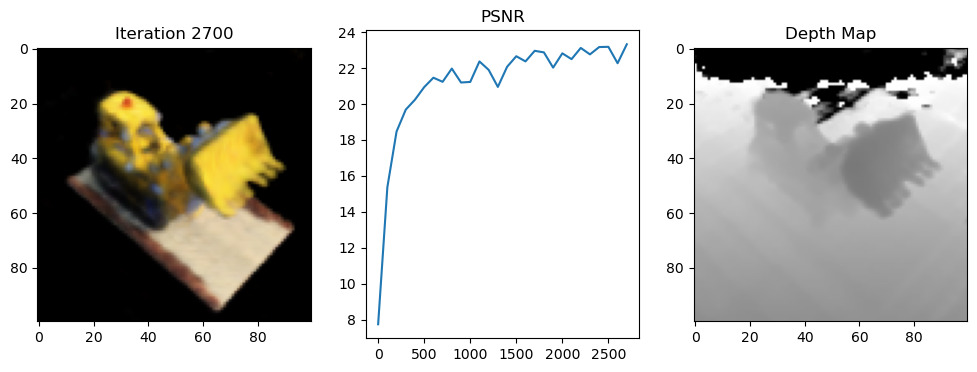

 28%|██▊       | 2797/10000 [01:52<03:27, 34.63it/s]

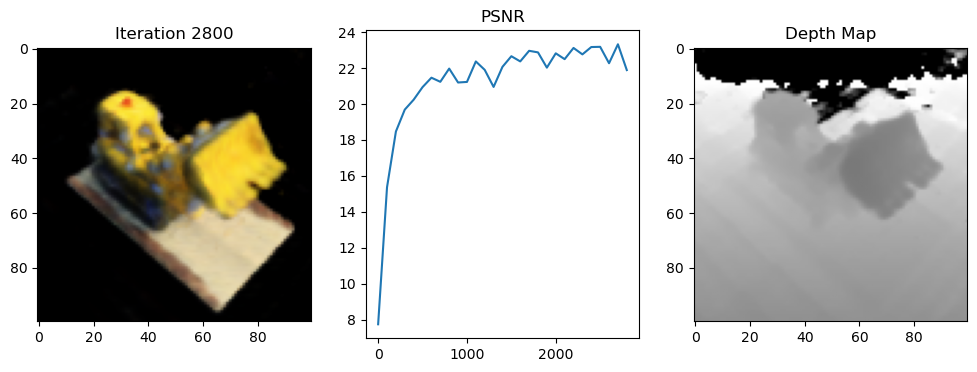

 29%|██▉       | 2897/10000 [01:56<03:24, 34.76it/s]

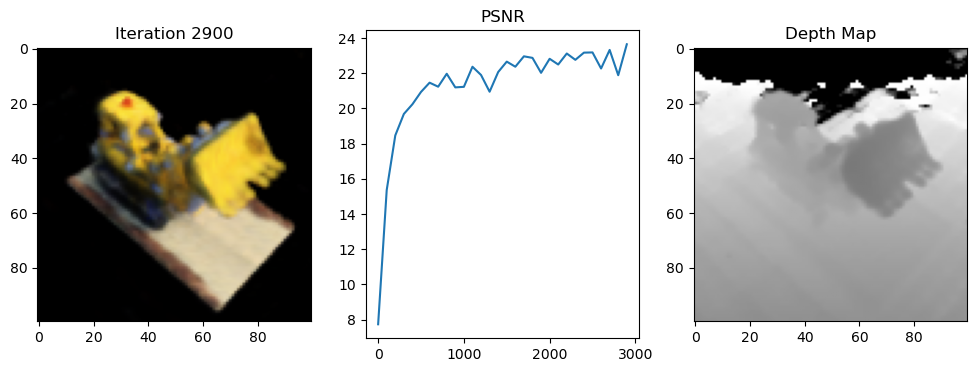

 30%|██▉       | 2997/10000 [02:00<03:22, 34.58it/s]

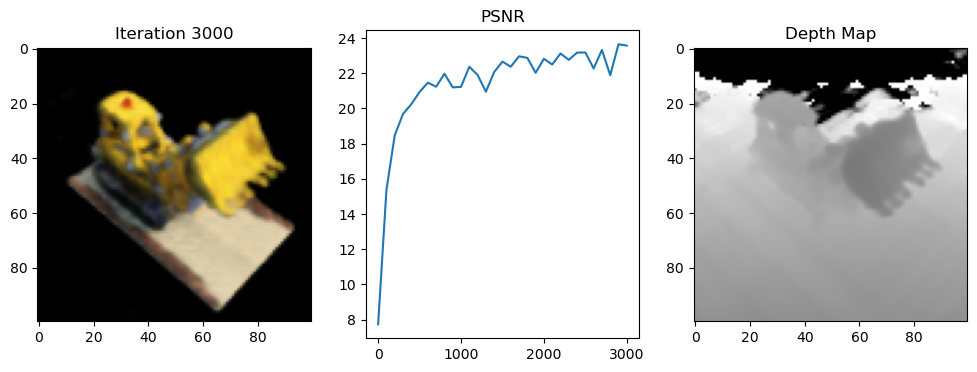

 31%|███       | 3097/10000 [02:04<03:18, 34.74it/s]

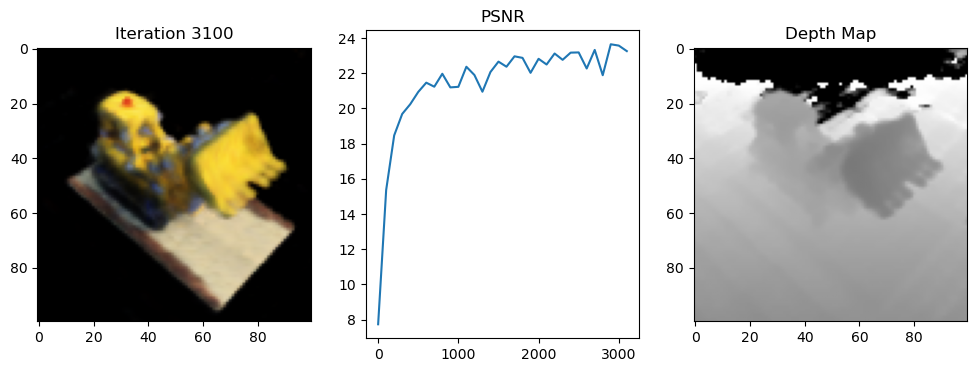

 32%|███▏      | 3197/10000 [02:08<03:16, 34.71it/s]

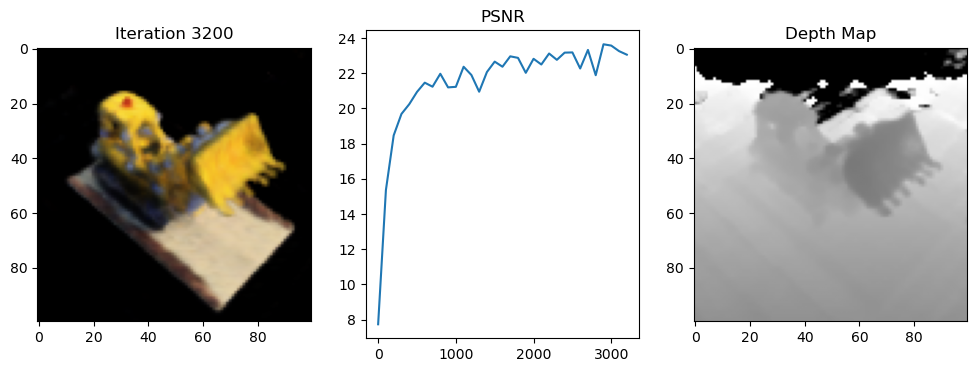

 33%|███▎      | 3297/10000 [02:12<03:13, 34.65it/s]

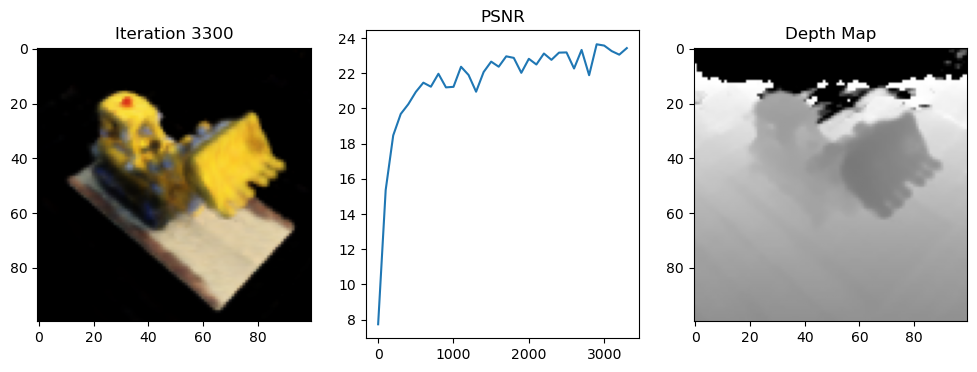

 34%|███▍      | 3397/10000 [02:16<03:10, 34.65it/s]

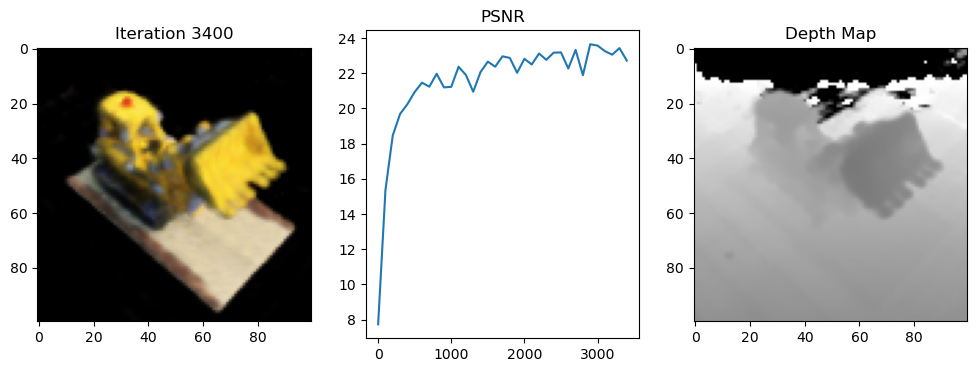

 35%|███▍      | 3497/10000 [02:20<03:07, 34.67it/s]

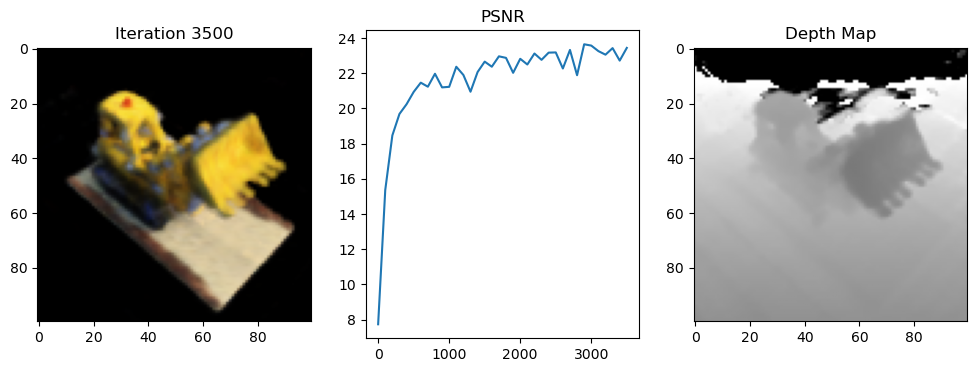

 36%|███▌      | 3597/10000 [02:24<03:04, 34.69it/s]

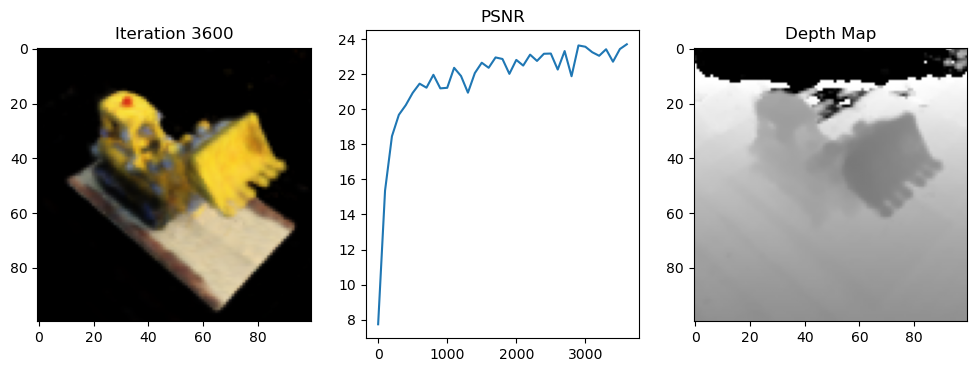

 37%|███▋      | 3697/10000 [02:28<03:02, 34.54it/s]

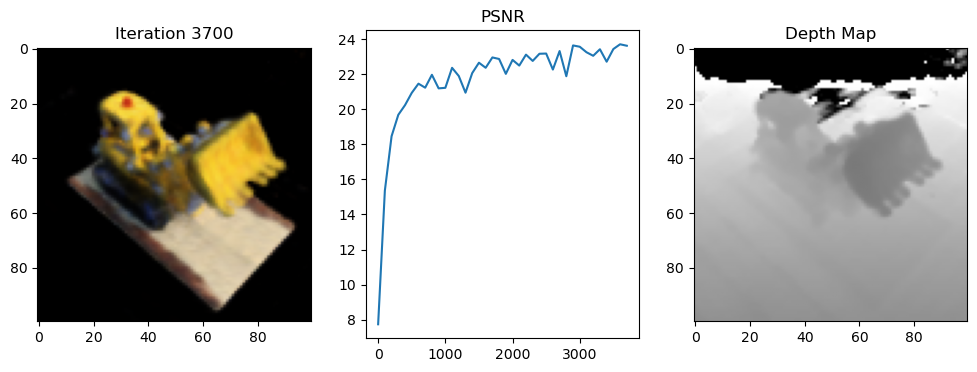

 38%|███▊      | 3797/10000 [02:32<03:00, 34.37it/s]

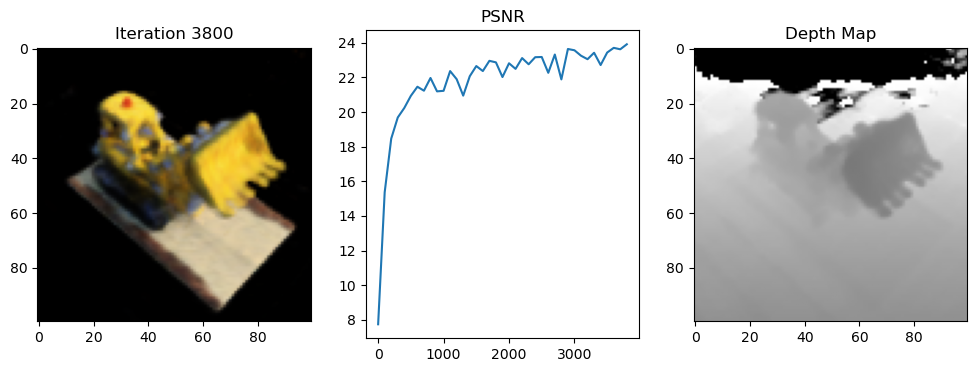

 39%|███▉      | 3897/10000 [02:36<02:56, 34.55it/s]

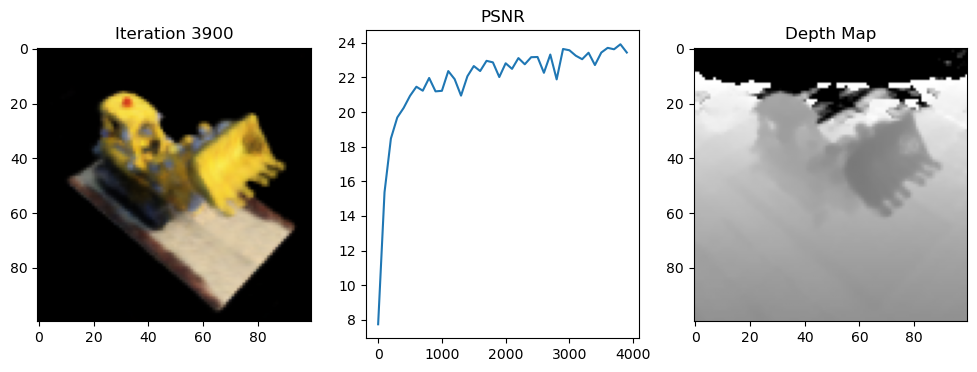

 40%|███▉      | 3997/10000 [02:40<02:54, 34.49it/s]

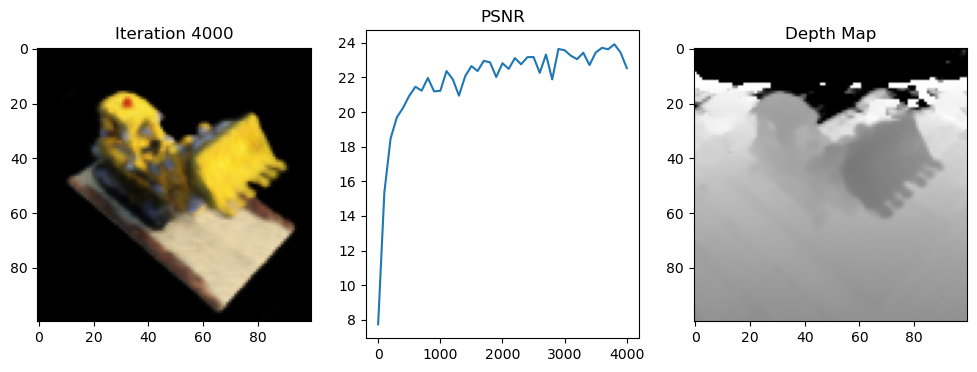

 41%|████      | 4097/10000 [02:44<02:51, 34.48it/s]

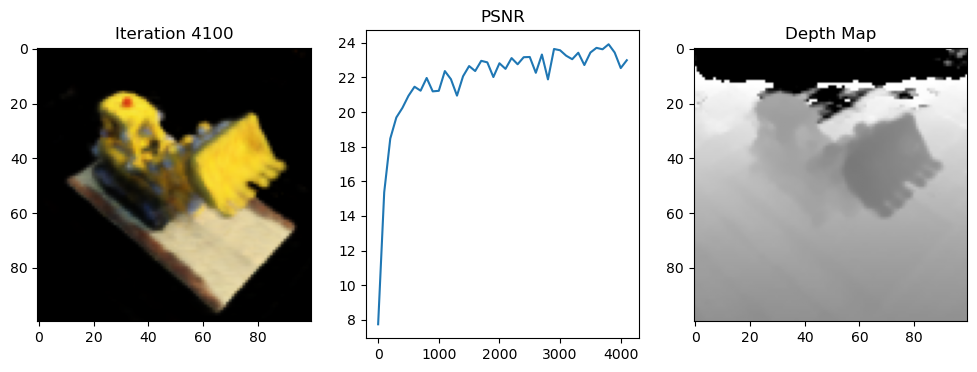

 42%|████▏     | 4197/10000 [02:48<02:47, 34.70it/s]

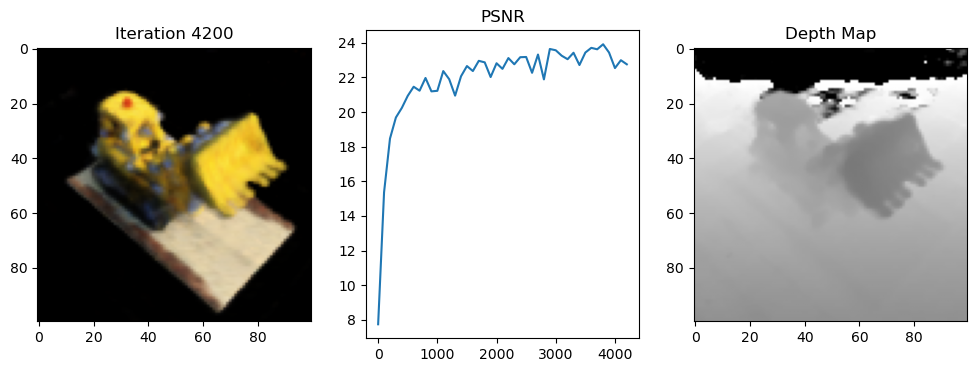

 43%|████▎     | 4297/10000 [02:52<02:44, 34.63it/s]

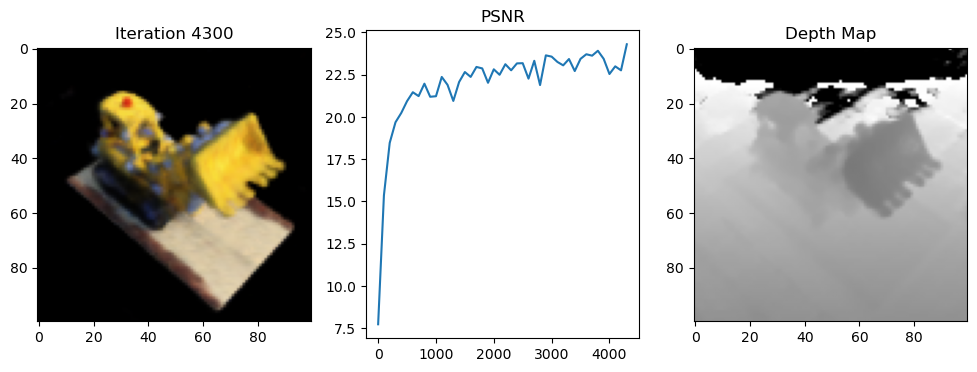

 44%|████▍     | 4397/10000 [02:56<02:42, 34.49it/s]

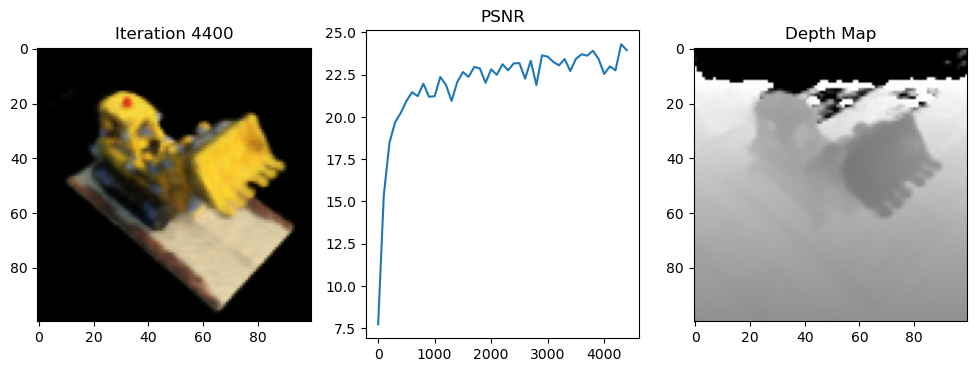

 45%|████▍     | 4497/10000 [03:00<02:37, 35.04it/s]

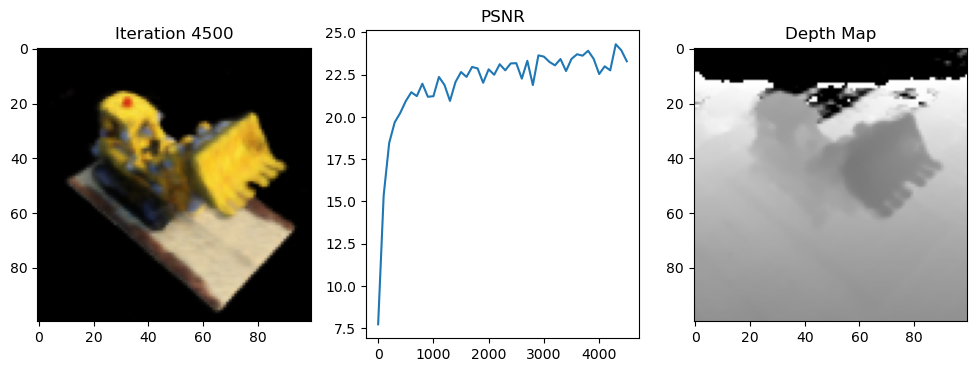

 46%|████▌     | 4597/10000 [03:04<02:34, 34.95it/s]

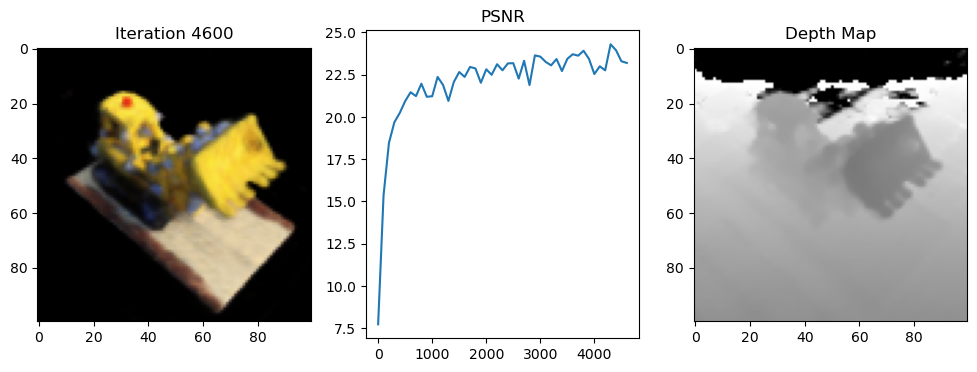

 47%|████▋     | 4697/10000 [03:08<02:33, 34.60it/s]

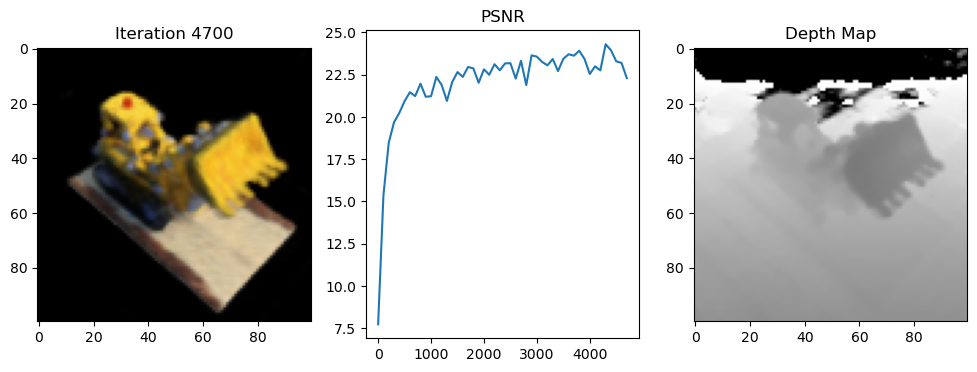

 48%|████▊     | 4797/10000 [03:12<02:30, 34.64it/s]

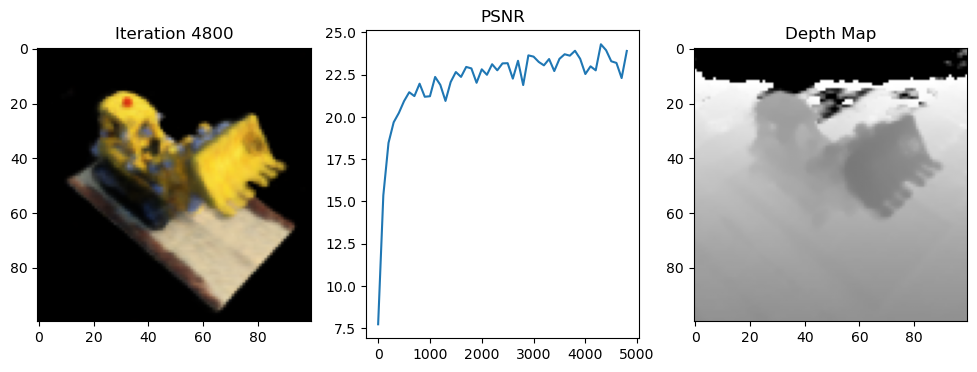

 49%|████▉     | 4897/10000 [03:16<02:27, 34.51it/s]

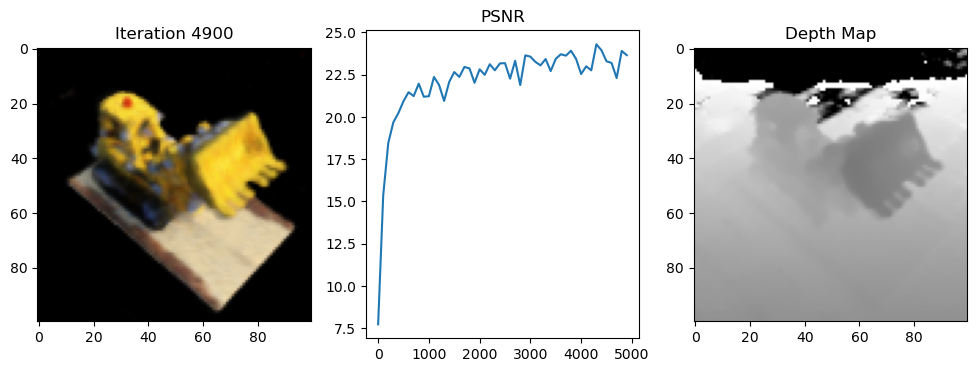

 50%|████▉     | 4997/10000 [03:20<02:23, 34.77it/s]

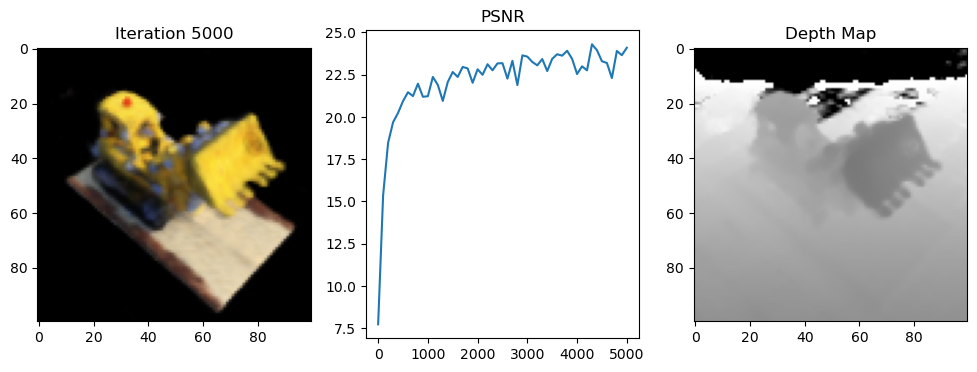

 51%|█████     | 5097/10000 [03:24<02:20, 34.78it/s]

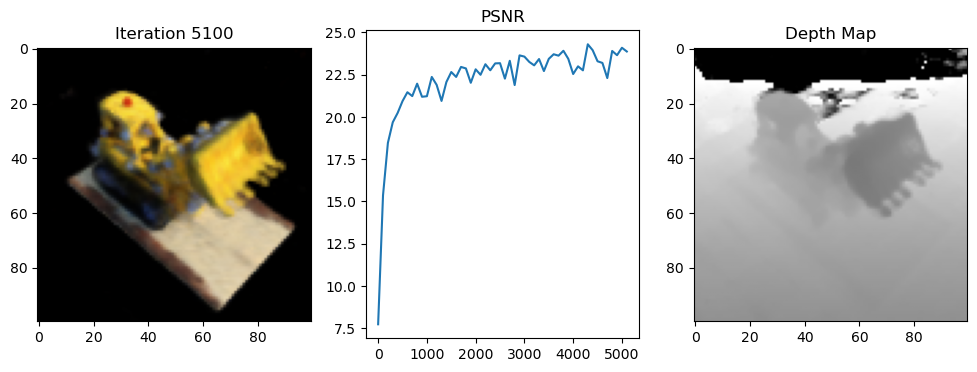

 52%|█████▏    | 5197/10000 [03:28<02:17, 34.87it/s]

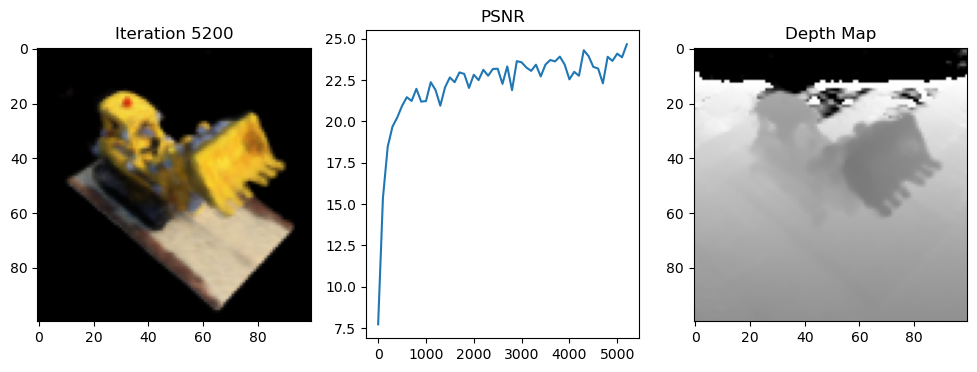

 53%|█████▎    | 5297/10000 [03:32<02:13, 35.14it/s]

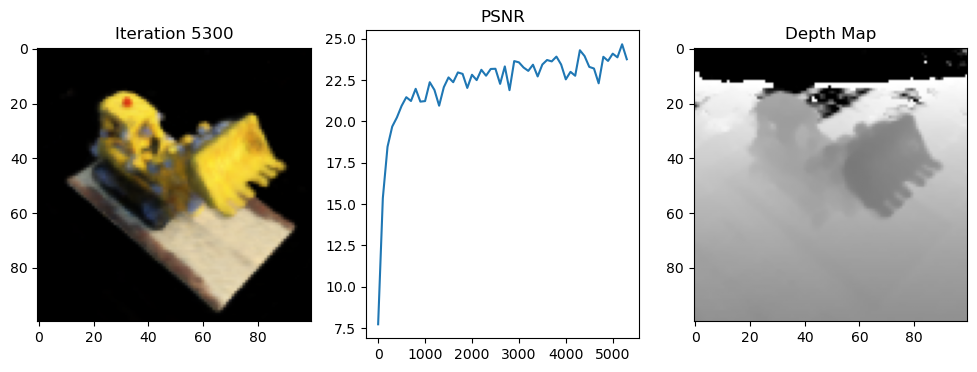

 54%|█████▍    | 5397/10000 [03:36<02:11, 35.11it/s]

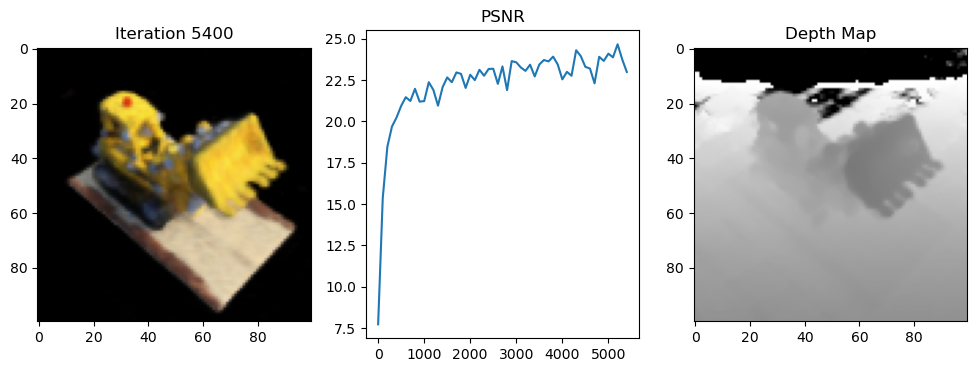

 55%|█████▍    | 5497/10000 [03:40<02:07, 35.21it/s]

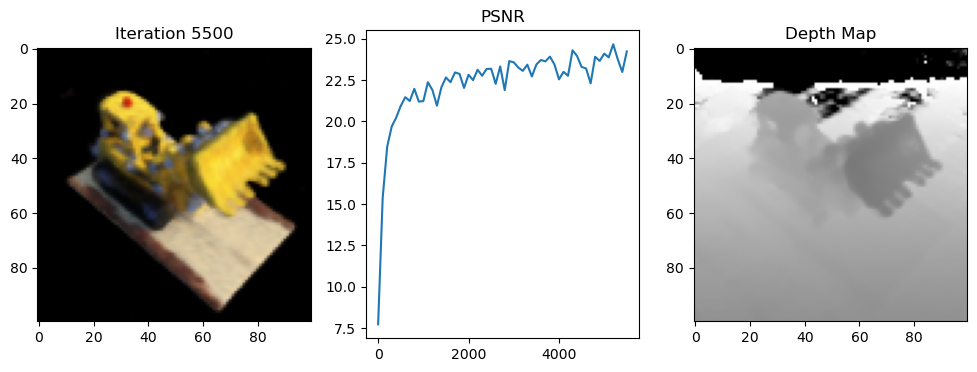

 56%|█████▌    | 5597/10000 [03:44<02:05, 35.10it/s]

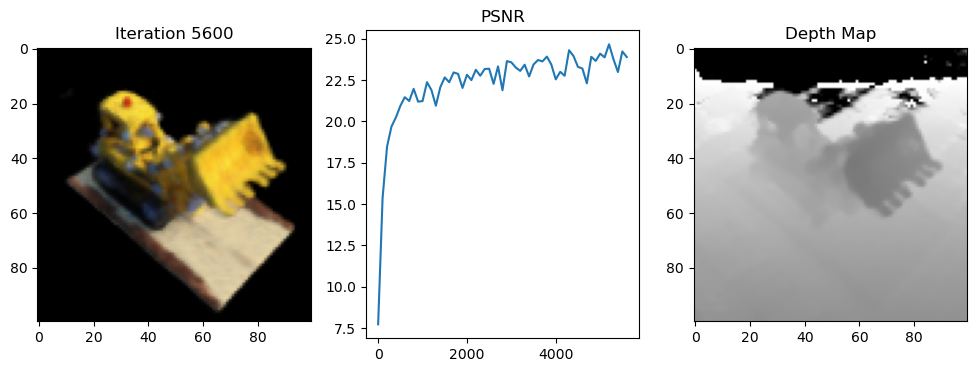

 57%|█████▋    | 5697/10000 [03:48<02:01, 35.29it/s]

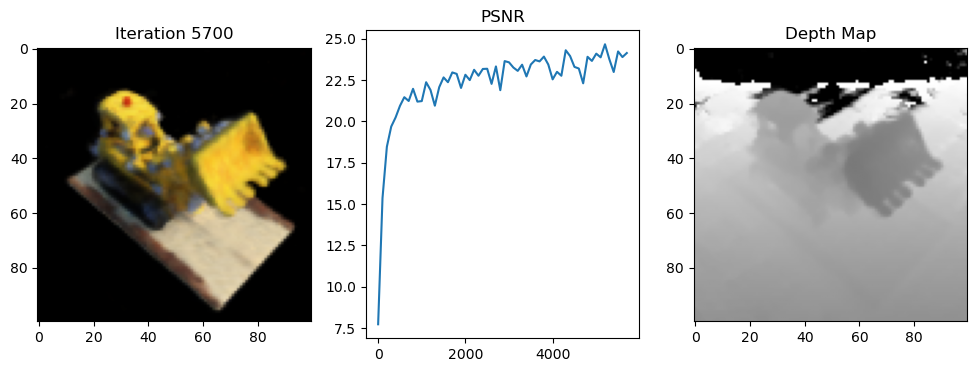

 58%|█████▊    | 5797/10000 [03:52<01:59, 35.14it/s]

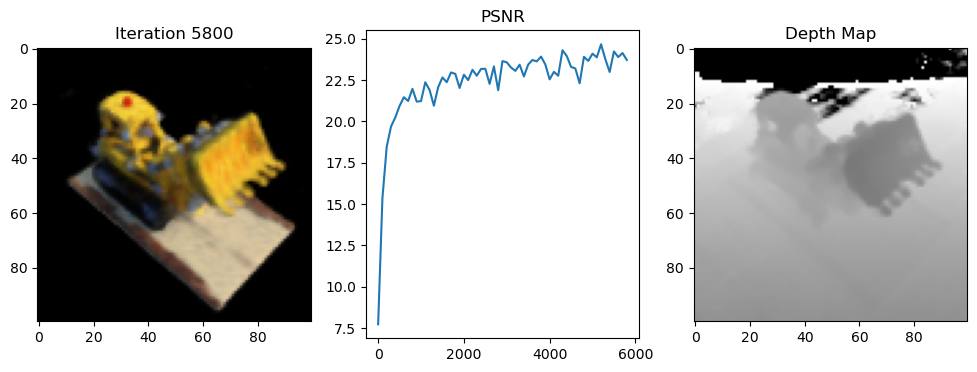

 59%|█████▉    | 5897/10000 [03:56<01:57, 35.03it/s]

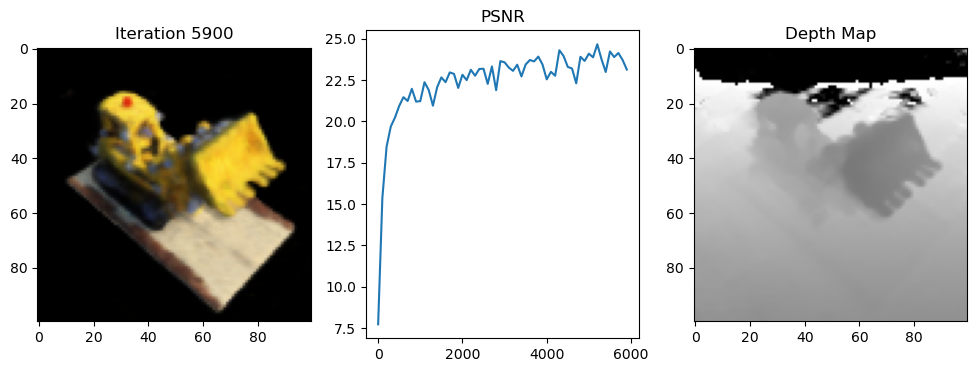

 60%|█████▉    | 5997/10000 [04:00<01:54, 34.97it/s]

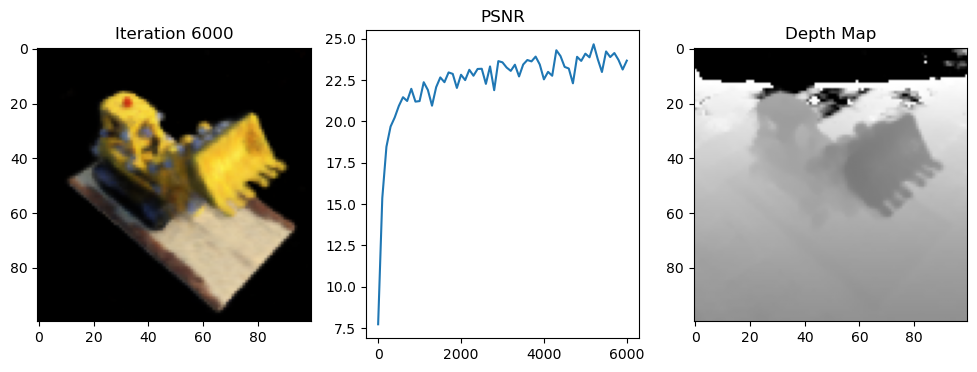

 61%|██████    | 6097/10000 [04:04<01:51, 35.13it/s]

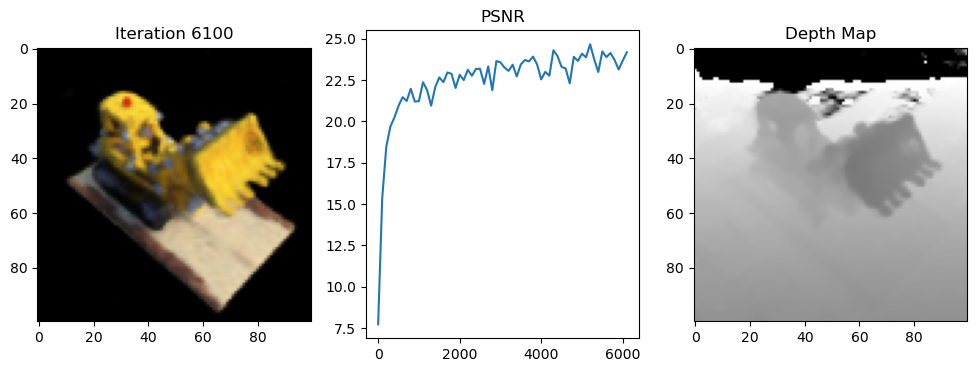

 62%|██████▏   | 6197/10000 [04:08<01:49, 34.65it/s]

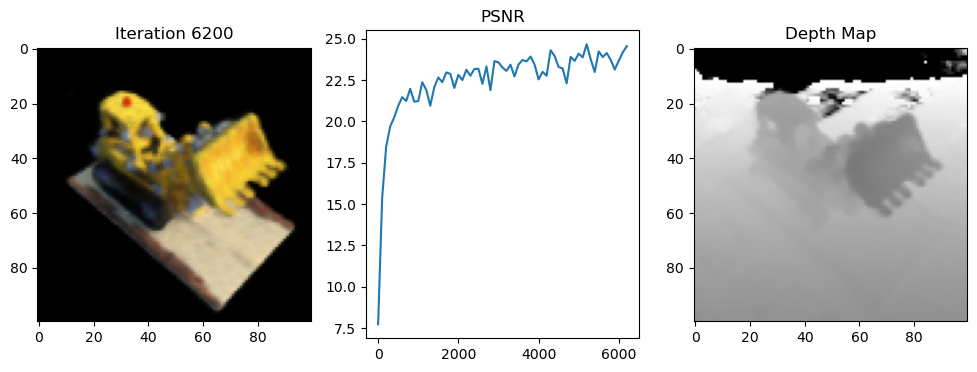

 63%|██████▎   | 6297/10000 [04:12<01:46, 34.69it/s]

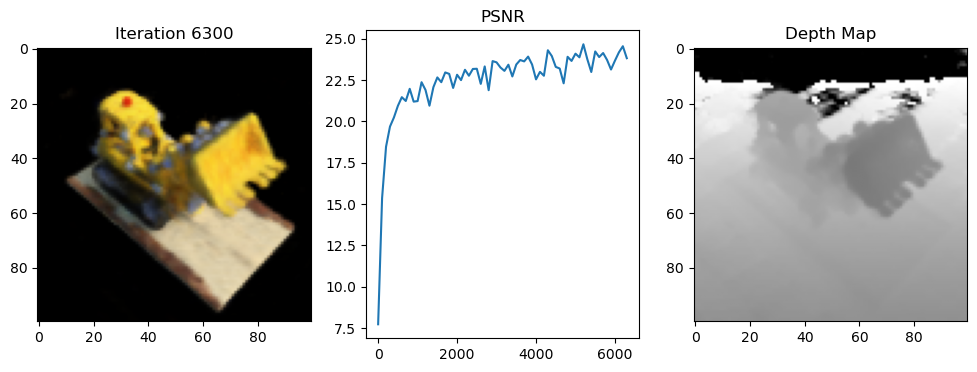

 64%|██████▍   | 6397/10000 [04:16<01:44, 34.56it/s]

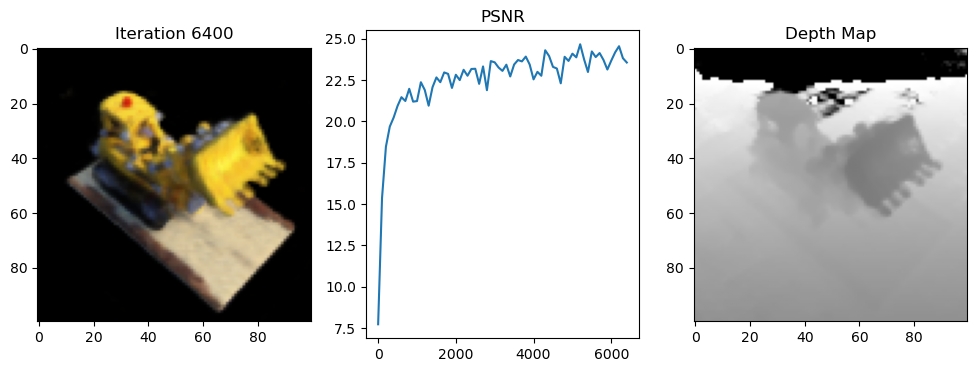

 65%|██████▍   | 6497/10000 [04:20<01:41, 34.65it/s]

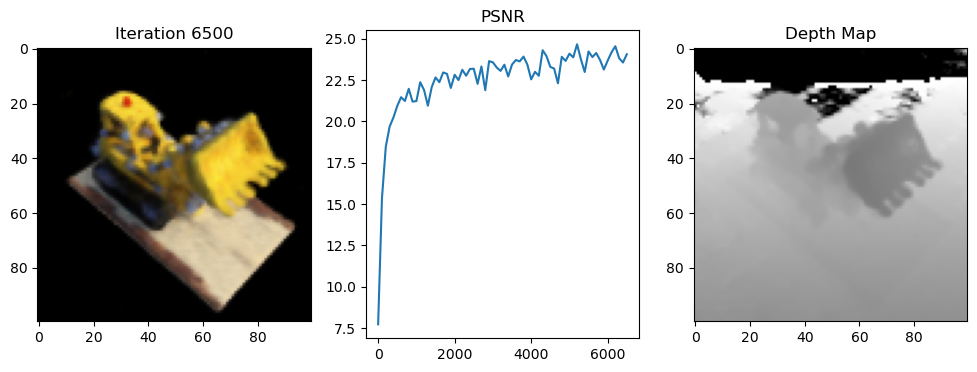

 66%|██████▌   | 6597/10000 [04:24<01:38, 34.51it/s]

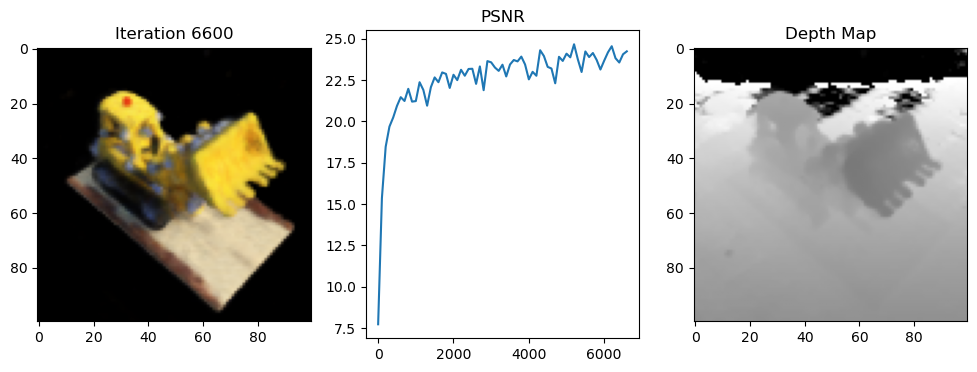

 67%|██████▋   | 6697/10000 [04:28<01:35, 34.69it/s]

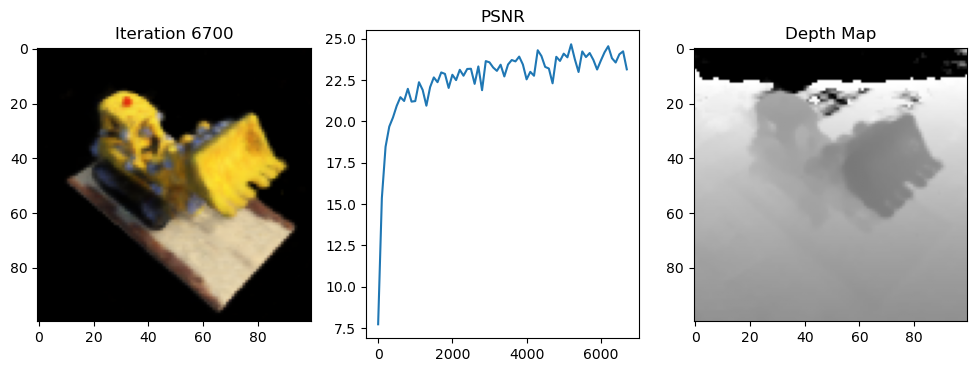

 68%|██████▊   | 6797/10000 [04:32<01:32, 34.60it/s]

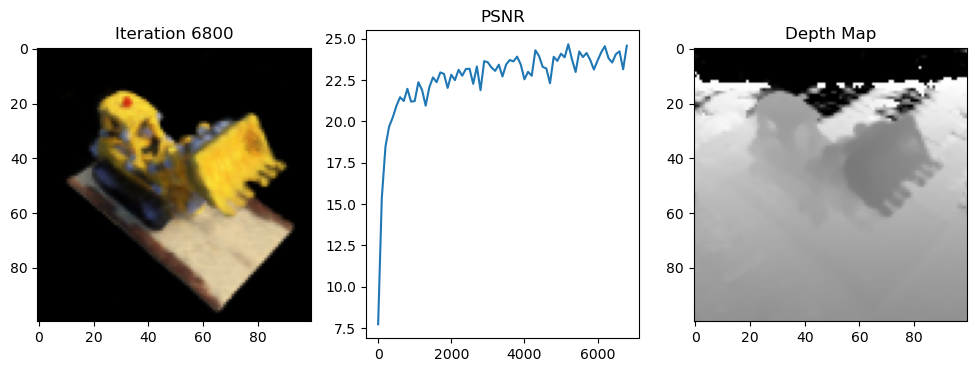

 69%|██████▉   | 6897/10000 [04:36<01:29, 34.48it/s]

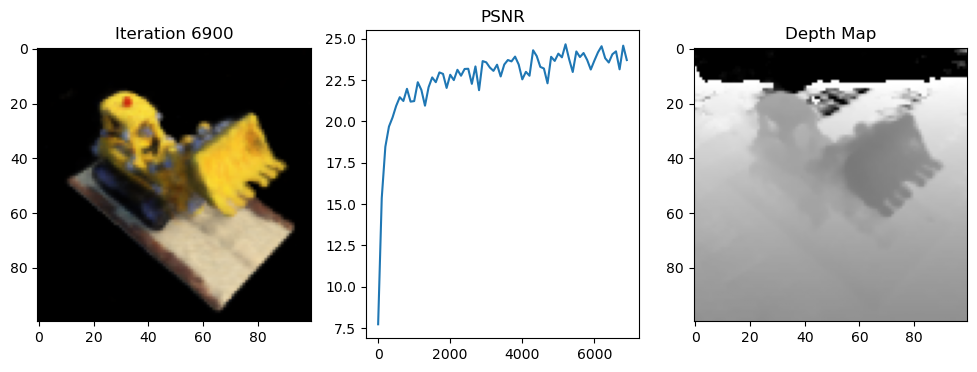

 70%|██████▉   | 6997/10000 [04:40<01:25, 35.15it/s]

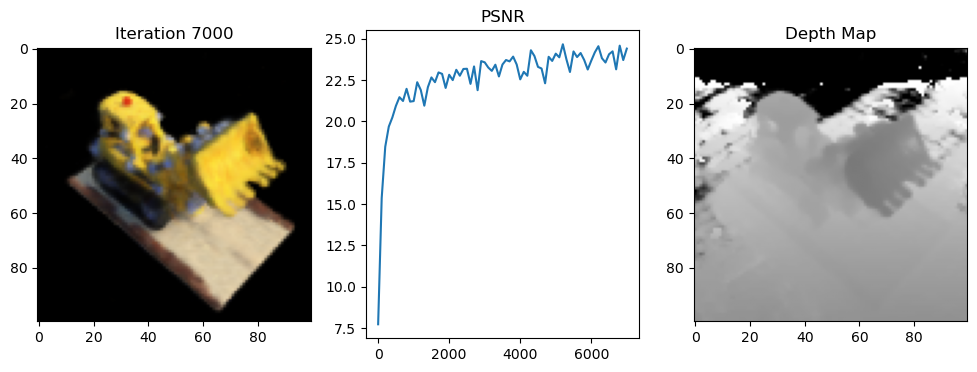

 71%|███████   | 7097/10000 [04:44<01:22, 35.22it/s]

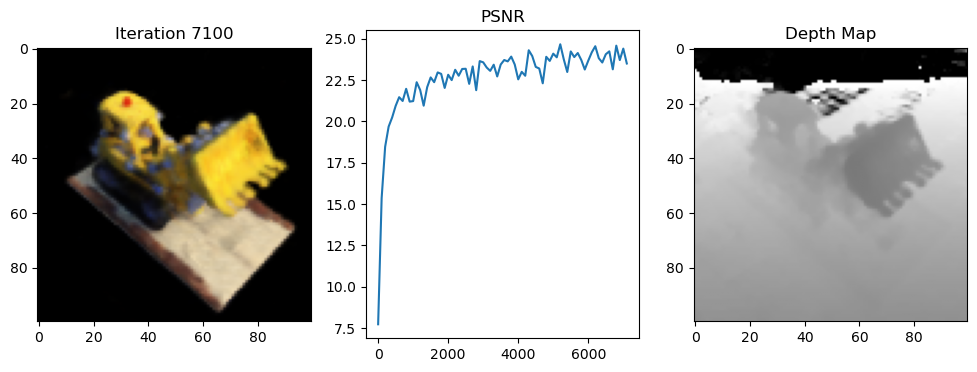

 72%|███████▏  | 7197/10000 [04:48<01:20, 34.83it/s]

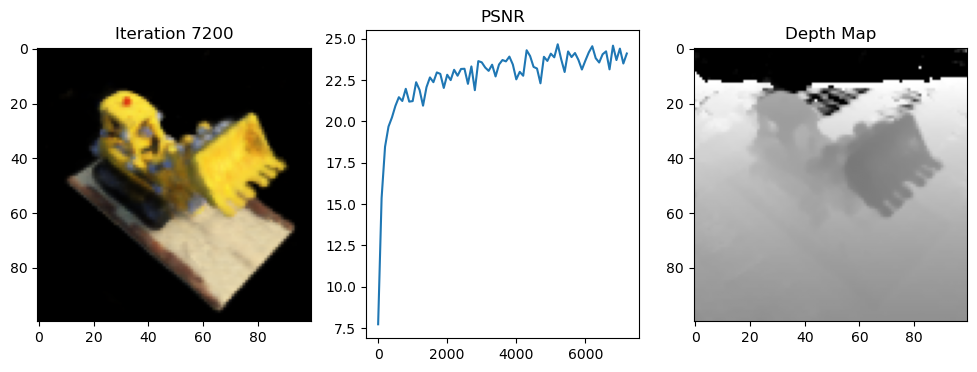

 73%|███████▎  | 7297/10000 [04:52<01:17, 35.00it/s]

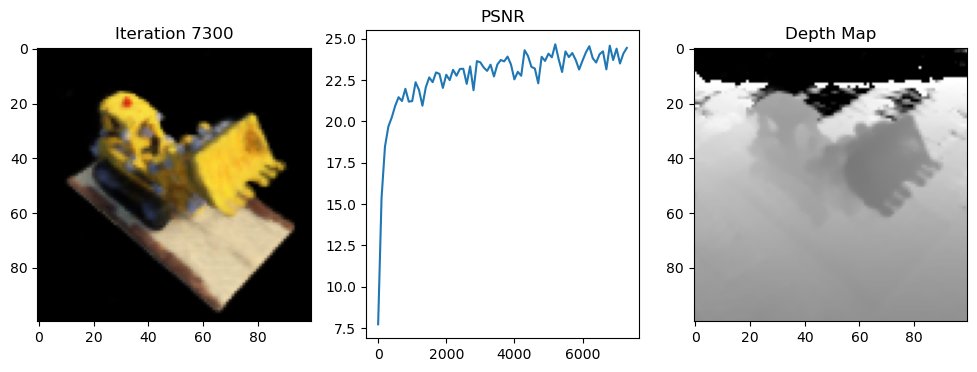

 74%|███████▍  | 7397/10000 [04:56<01:14, 35.02it/s]

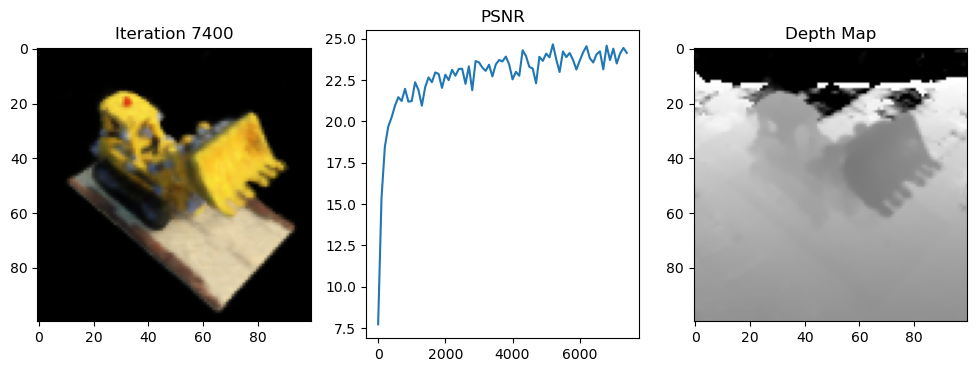

 75%|███████▍  | 7497/10000 [05:00<01:11, 34.97it/s]

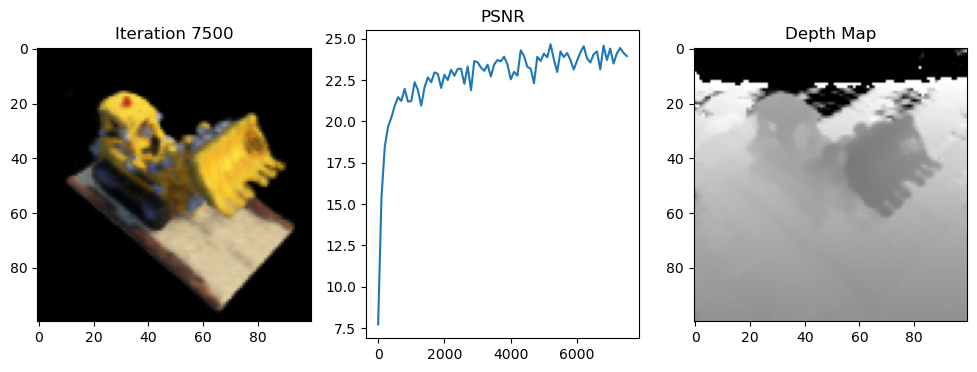

 76%|███████▌  | 7597/10000 [05:04<01:08, 35.00it/s]

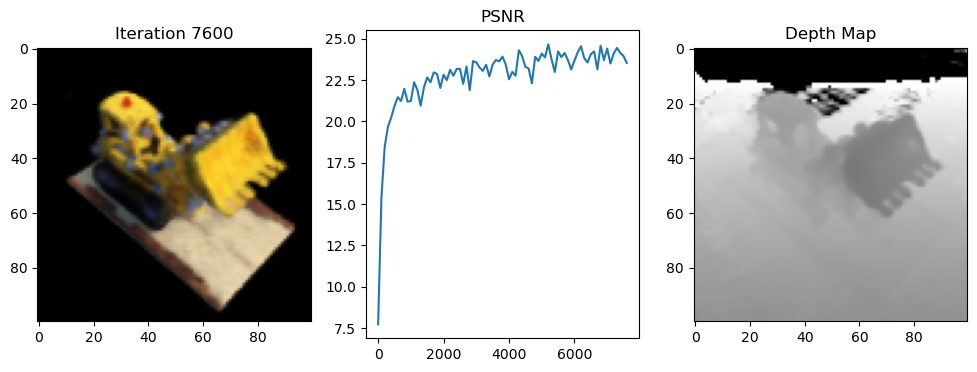

 77%|███████▋  | 7697/10000 [05:08<01:05, 34.98it/s]

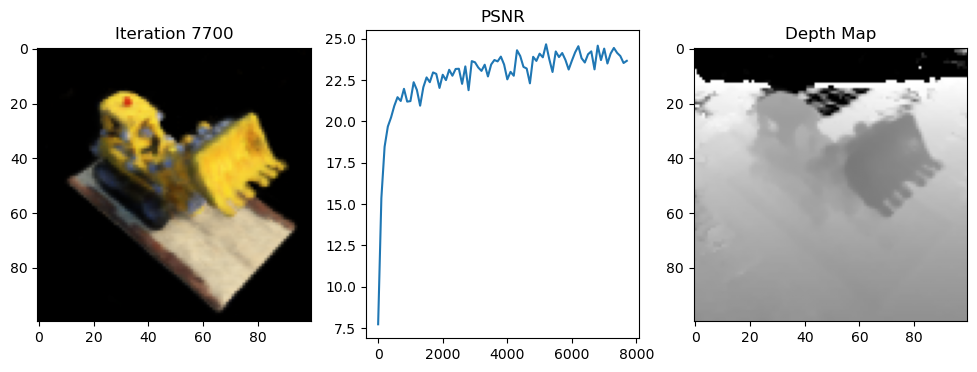

 78%|███████▊  | 7797/10000 [05:12<01:03, 34.83it/s]

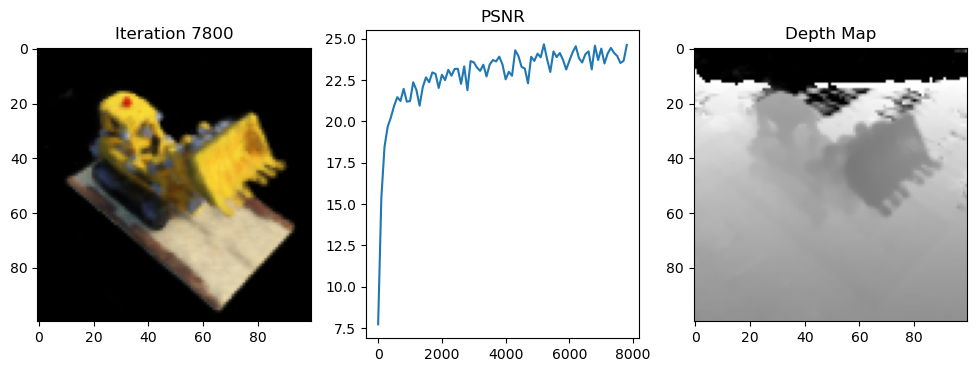

 79%|███████▉  | 7897/10000 [05:16<01:00, 34.83it/s]

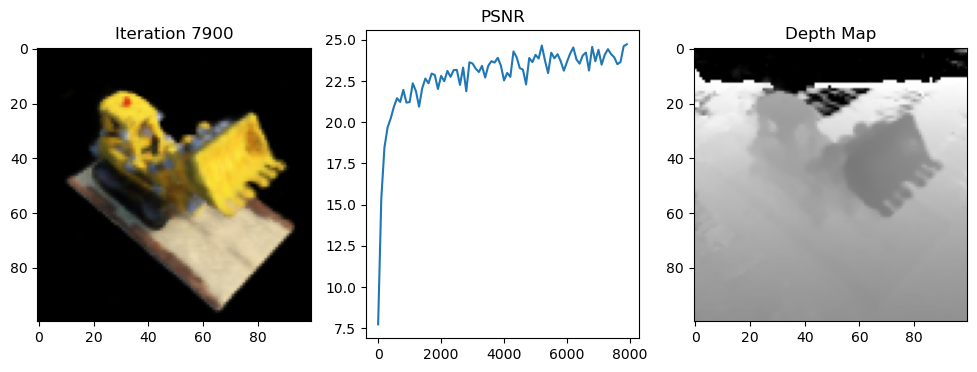

 80%|███████▉  | 7997/10000 [05:20<00:57, 34.63it/s]

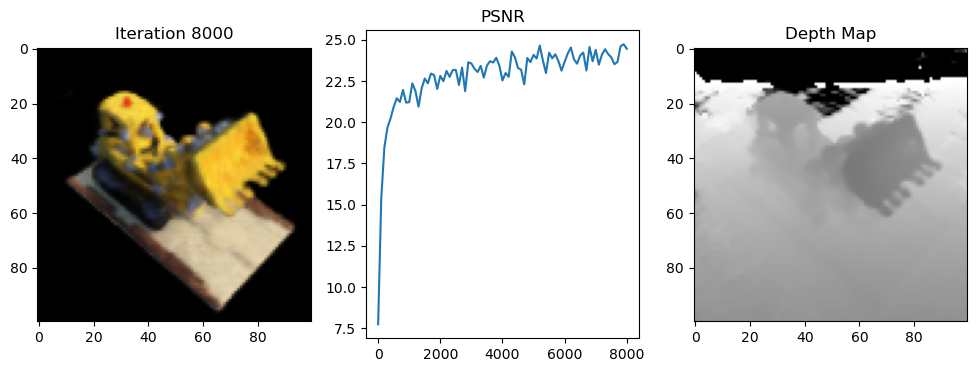

 81%|████████  | 8097/10000 [05:24<00:54, 35.07it/s]

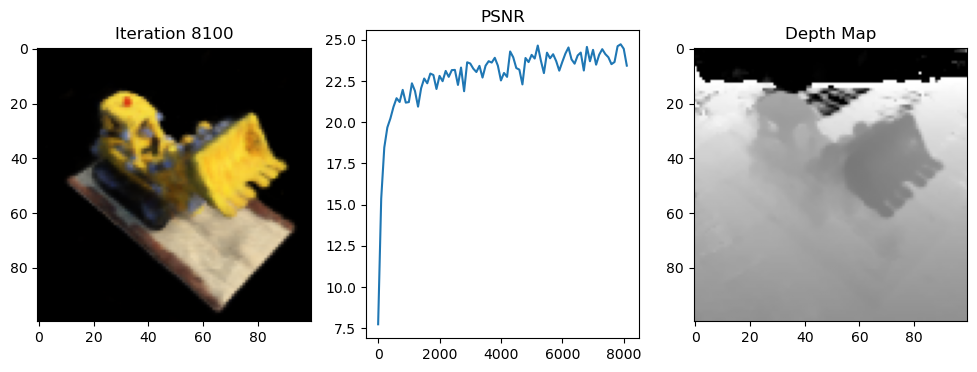

 82%|████████▏ | 8197/10000 [05:28<00:52, 34.63it/s]

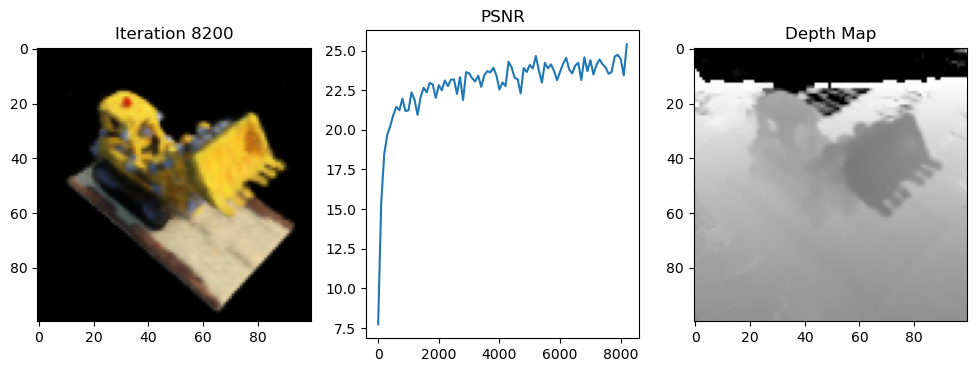

 83%|████████▎ | 8297/10000 [05:32<00:49, 34.66it/s]

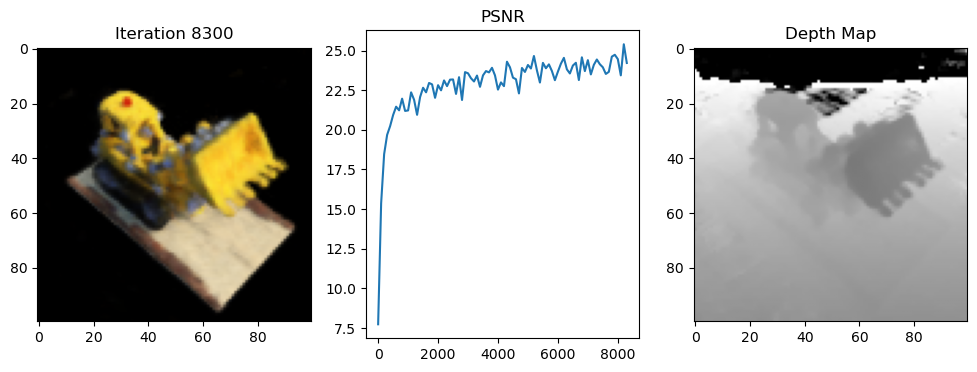

 84%|████████▍ | 8397/10000 [05:36<00:46, 34.61it/s]

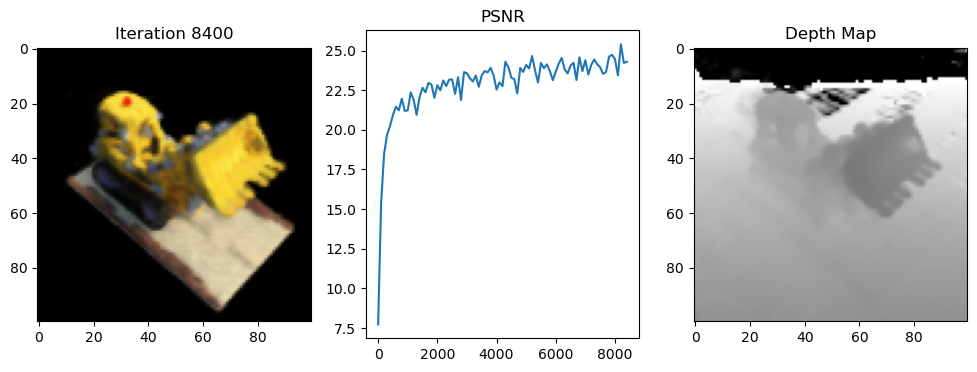

 85%|████████▍ | 8497/10000 [05:40<00:43, 34.62it/s]

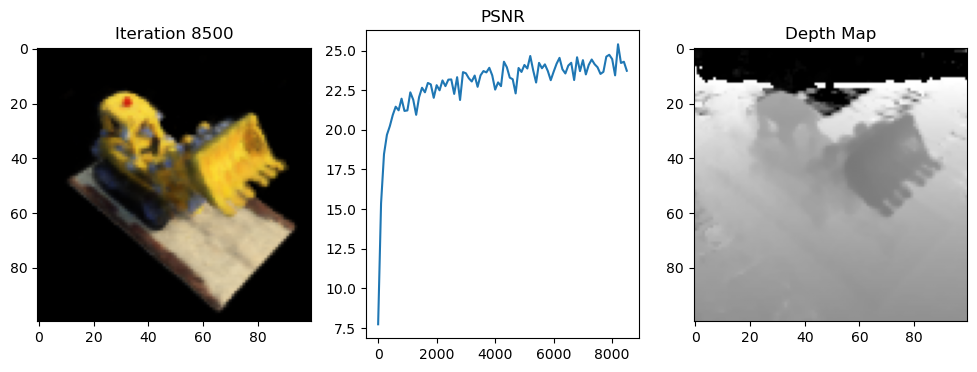

 86%|████████▌ | 8597/10000 [05:44<00:40, 34.62it/s]

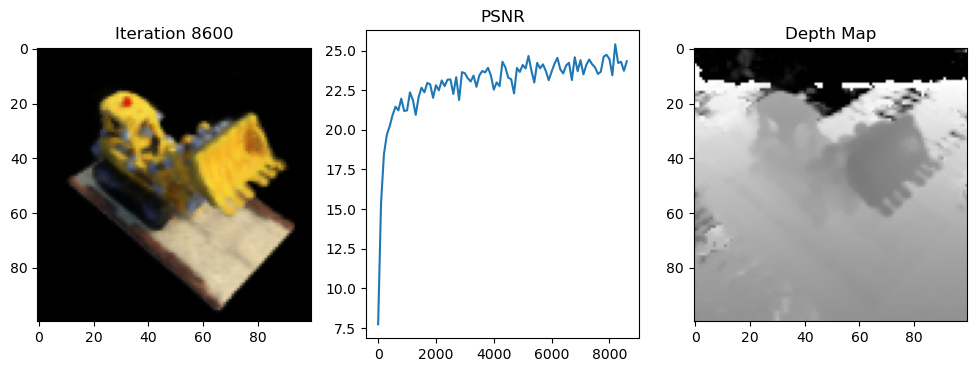

 87%|████████▋ | 8697/10000 [05:49<00:37, 34.59it/s]

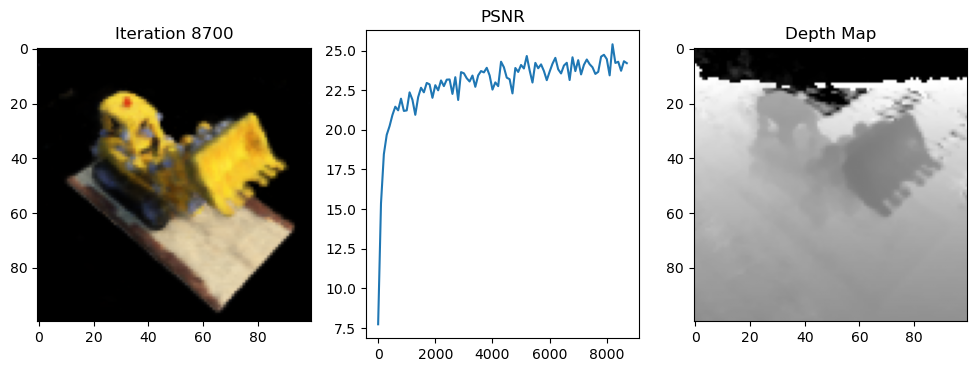

 88%|████████▊ | 8797/10000 [05:53<00:34, 34.57it/s]

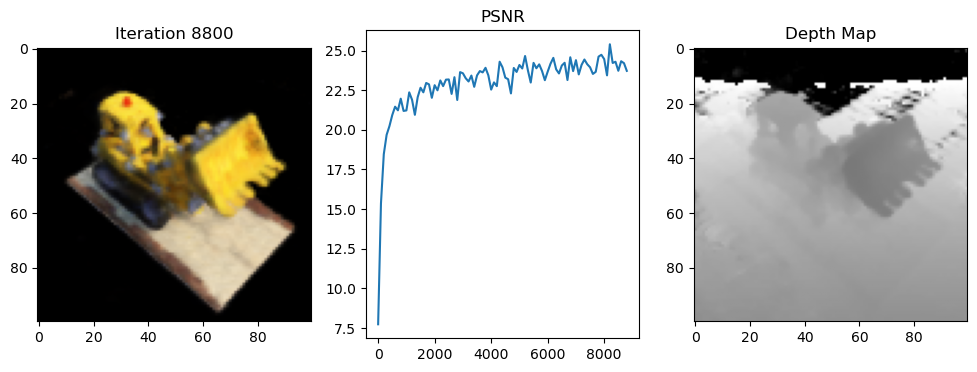

 89%|████████▉ | 8897/10000 [05:57<00:31, 34.72it/s]

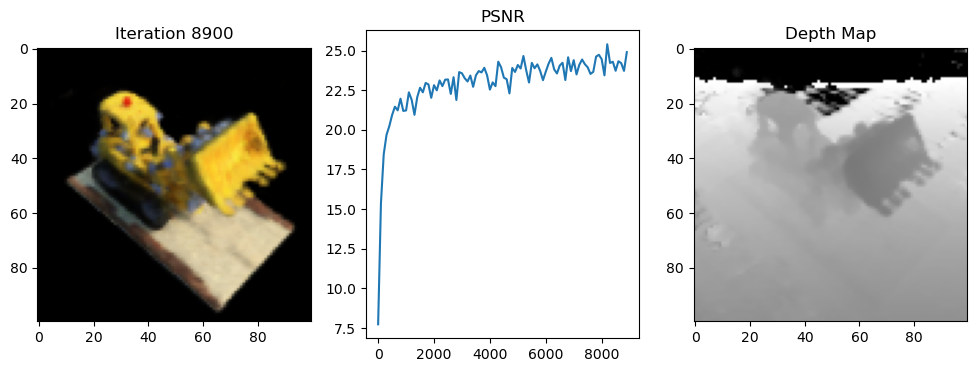

 90%|████████▉ | 8997/10000 [06:01<00:28, 34.60it/s]

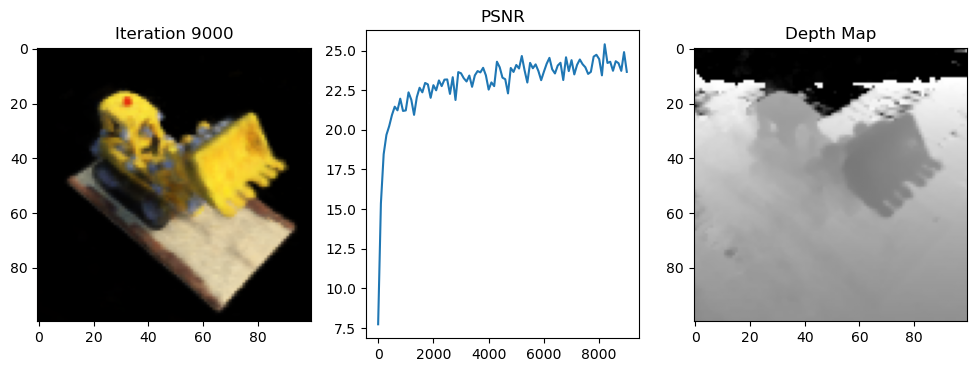

 91%|█████████ | 9097/10000 [06:05<00:25, 34.77it/s]

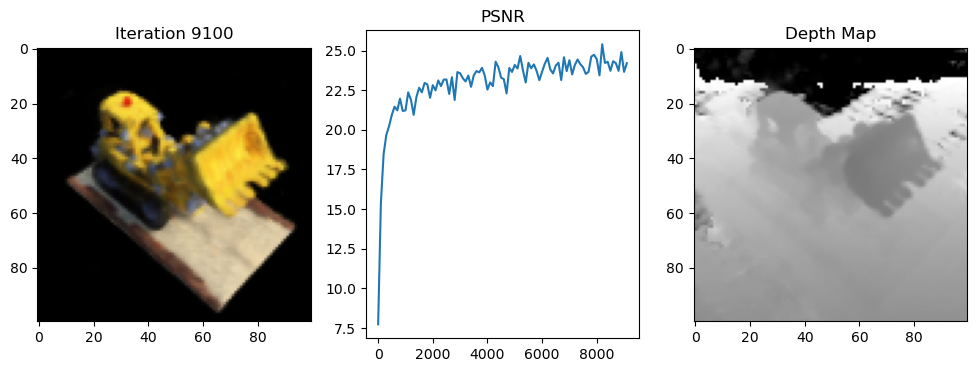

 92%|█████████▏| 9197/10000 [06:09<00:23, 34.75it/s]

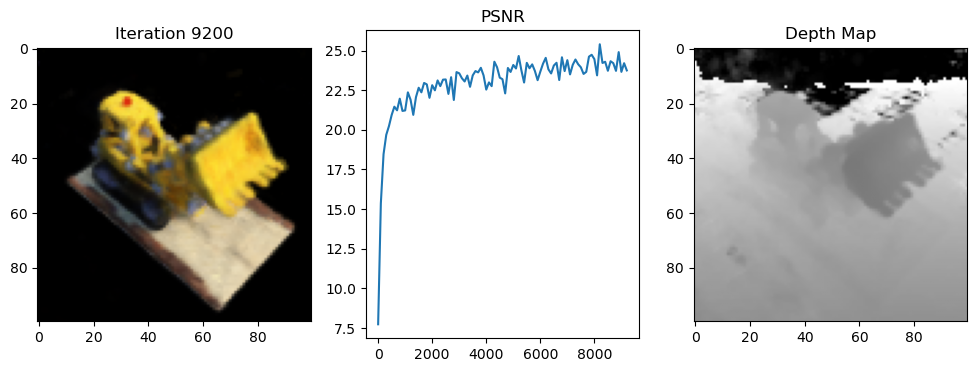

 93%|█████████▎| 9297/10000 [06:13<00:20, 34.66it/s]

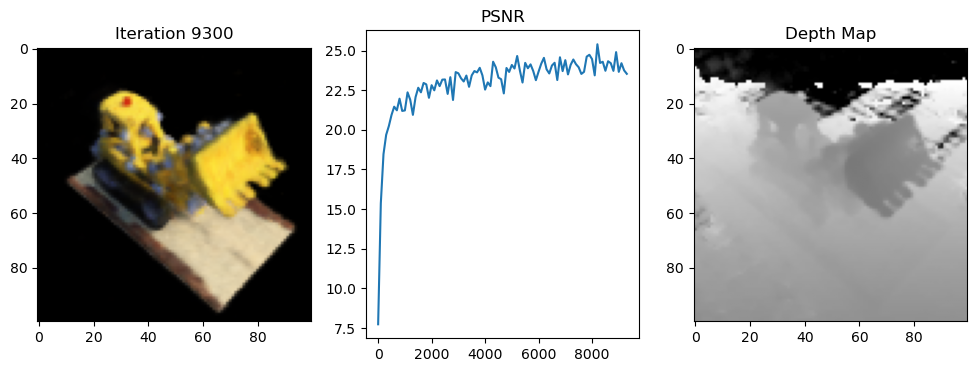

 94%|█████████▍| 9397/10000 [06:17<00:17, 34.61it/s]

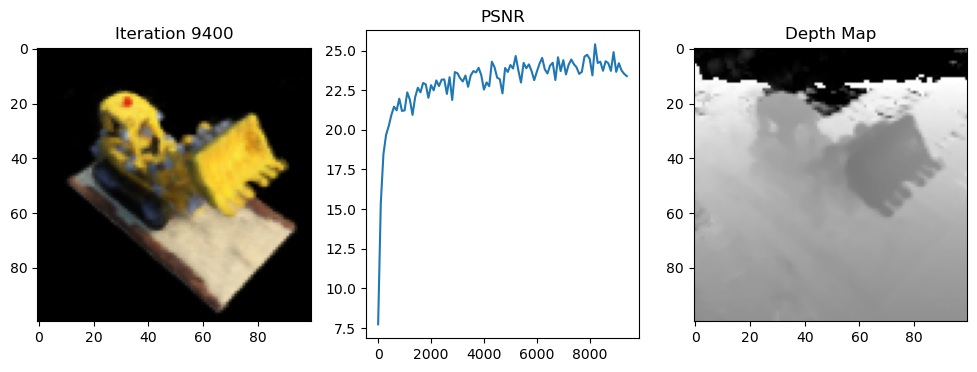

 95%|█████████▍| 9497/10000 [06:21<00:14, 34.65it/s]

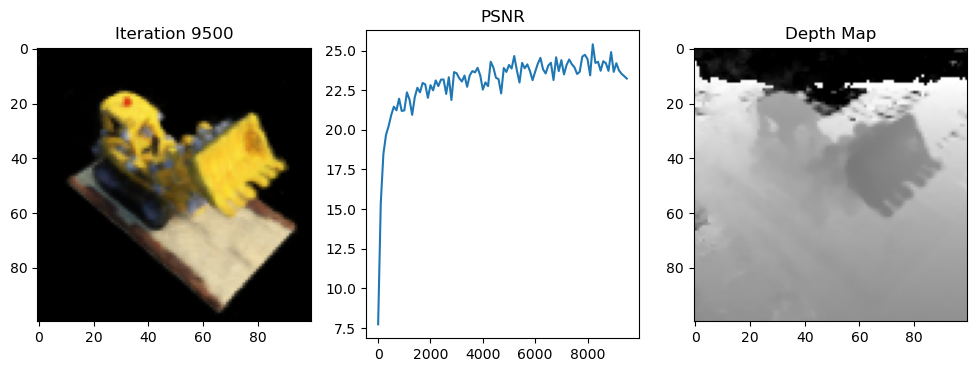

 96%|█████████▌| 9597/10000 [06:25<00:11, 34.66it/s]

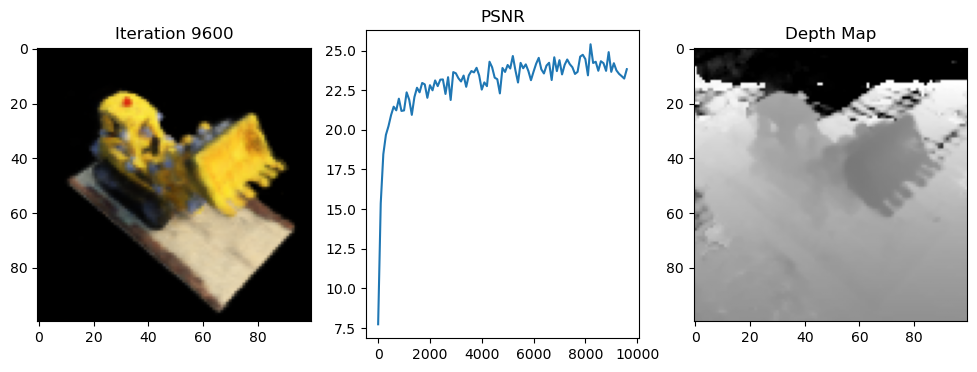

 97%|█████████▋| 9697/10000 [06:29<00:08, 34.74it/s]

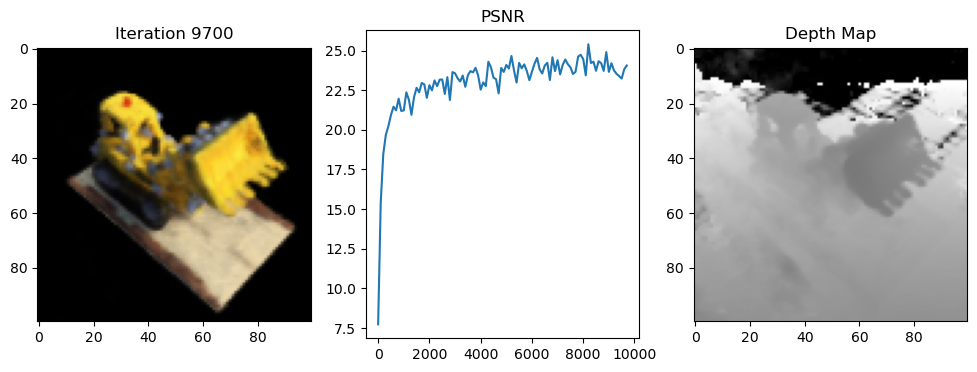

 98%|█████████▊| 9797/10000 [06:33<00:05, 34.63it/s]

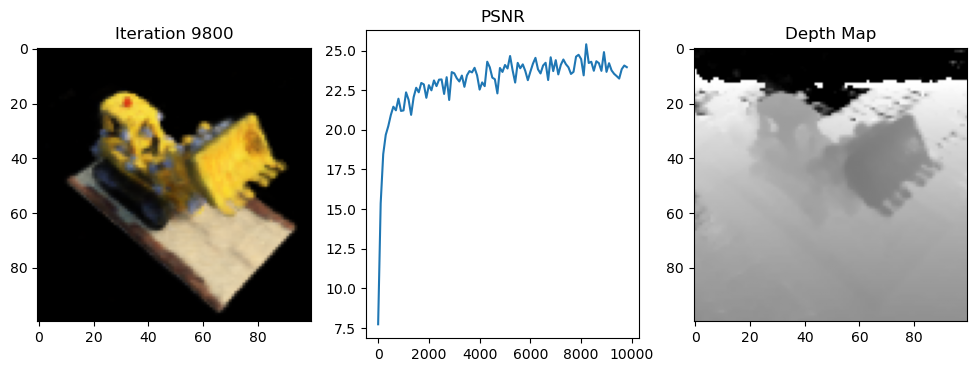

 99%|█████████▉| 9897/10000 [06:37<00:02, 34.71it/s]

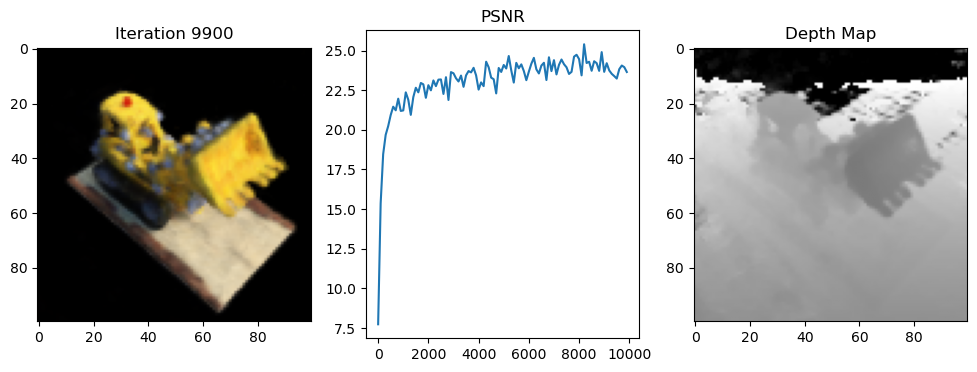

100%|██████████| 10000/10000 [06:41<00:00, 24.91it/s]

Done


In [ ]:
data = np.load('tiny_nerf_data.npz') # NumPy 파일에서 NeRF 데이터 로드
images = data['images']
poses = data['poses']
focal = data['focal']

# NumPy 데이터를 PyTorch Tensor로 변환하고 GPU/CPU 장치로 이동
images = torch.from_numpy(images).to(device)
poses = torch.from_numpy(poses).to(device)
focal = torch.from_numpy(focal).to(device)

H, W = images.shape[1:3] # (n, h, w, c) 이미지 높이(H)와 너비(W) 추출 (여기서 c는 rgb+투명도임)

# Define test set, training set
testimg, testpose = images[101], poses[101] # 102번째 데이터를 테스트용으로 분리
images = images[:100,...,:3] # 처음 100개 이미지를 학습 데이터로 사용 (RGB만)
poses = poses[:100] # 처음 100개 포즈를 학습 데이터로 사용

# Hyperparameters
N_samples = 64 # 각 광선(Ray)을 따라 샘플링할 3D 점의 개수
N_iters = 10000 # 총 학습 반복 횟수 (Iteration)
psnrs = [] # PSNR 값 기록 리스트(테스트 이미지의 psnr 값 저장)
iternums = [] # 반복 횟수 기록 리스트
i_plot = 100 # 테스트 이미지 렌더링 및 시각화 빈도
lr = 5e-3 # 학습률 (Learning Rate)

# psnr (peak single to noise ratio)
# 이미지 품질 평가 지표
# mse 이 적을 수록 에러가 적어짐
# >> psnr 은 증가한다

# Define NeRF model, optimizer
model = NeRF() # NeRF MLP 모델 생성
model = model.to(device) # 모델을 지정된 장치(GPU/CPU)로 이동
optimizer = torch.optim.Adam(model.parameters(), lr=lr) # Adam 옵티마이저 정의

# NeRF optimization loop
print("NeRF optimization start")
plot_image = True # 시각화 여부 플래그

for i in tqdm(range(N_iters)): # 설정된 반복 횟수만큼 학습 루프 시작 (tqdm으로 진행 상황 표시)
    img_i = np.random.randint(images.shape[0]) # 학습 데이터에서 무작위로 하나의 이미지 인덱스 선택
    target = images[img_i].to(device) # 타겟 이미지 (정답)
    pose = poses[img_i].to(device) # 해당 이미지의 카메라 포즈

    # 1. Ray Generation: 무작위로 선택된 포즈에서 나오는 모든 광선(rays) 계산
    # 카메라 좌표계에서 각 픽셀방향으로 광선을 쏜다
    rays_o, rays_d = get_rays(H, W, focal, pose)

    # 2. Volume Rendering: 광선을 따라 3D 샘플링 및 NeRF 모델 쿼리 후 렌더링
    # rand=True를 사용하여 훈련 시 샘플링 깊이에 무작위 오프셋 추가 (노이즈 방지)
    rgb, depth, acc = render_rays(model, rays_o, rays_d, near=2.0, far=6.0, N_samples=N_samples, rand=True)
    # 각 ray(광선) 따라서 64개 점 샘플링
    # NeRF MLP 통과 >> 각각의 색상, 밀도 예측
    # 볼륨렌더링 최종 C(rgb), depth

    # Back propagation
    # 3. Loss Calculation: 렌더링된 RGB와 타겟 이미지 간의 MSE 손실 계산
    loss = torch.nn.functional.mse_loss(rgb, target)
    loss.backward() # 역전파 (기울기 계산)
    optimizer.step() # 옵티마이저를 통해 모델 파라미터 업데이트
    optimizer.zero_grad() # 다음 반복을 위해 기울기 초기화

    if plot_image:
        if i % i_plot == 0: # i_plot 간격마다 테스트 및 시각화 수행
            # --- Test Rendering (Evaluation) ---
            # 테스트 포즈를 사용하여 광선 계산 (rand=False로 확정적 샘플링)
            rays_o, rays_d = get_rays(H, W, focal, testpose)
            # 테스트 이미지 렌더링
            rgb, depth, acc = render_rays(model, rays_o, rays_d, near=2.0, far=6.0, N_samples=N_samples)

            # --- PSNR Calculation ---
            loss = torch.nn.functional.mse_loss(rgb, testimg) # 테스트 이미지와의 손실
            # PSNR(Peak Signal-to-Noise Ratio) 계산: 이미지 품질 측정 지표
            psnr = -10.0 * torch.log10(loss)

            # --- Record ---
            psnrs.append(psnr.item())
            iternums.append(i)

            # --- Visualization ---
            plt.figure(figsize=(12, 4))

            # 렌더링된 RGB 이미지 시각화
            plt.subplot(131)
            plt.imshow(rgb.cpu().detach().numpy())
            plt.title(f"Iteration {i}")

            # PSNR 변화 그래프 시각화
            plt.subplot(132)
            plt.plot(iternums, psnrs)
            plt.title("PSNR")

            # 렌더링된 깊이 맵(Depth Map) 시각화
            plt.subplot(133)
            plt.imshow(depth.cpu().detach().numpy(), cmap="gray")
            plt.title("Depth Map")

            # 플롯 창 자동 닫기 설정
            plt.show(block=False)
            # plt.pause(1) # 1초 동안 잠시 화면 표시
            plt.close() # 플롯 창 닫기 (메모리 관리)

print("Done")

In [25]:
torch.save(model.state_dict(),'model.pt')

# Interactive Visualization

In [31]:
save_video = True # 영상 저장 활성화 플래그 (현재는 비활성화)
if save_video:
    print("Video save start")
    import imageio # 영상 파일 생성에 필요한 라이브러리 임포트

    # --- 카메라 포즈 변환 행렬 정의 ---
    # NeRF에서 자주 사용되는 카메라 포즈를 쉽게 계산하기 위한 헬퍼 함수
    trans_t = lambda t : np.array([ # Z축 평행 이동(Translation) 행렬
        [1, 0, 0, 0],
        [0, 1, 0, 0],
        [0, 0, 1, t], # z축(방향)으로 t만큼 이동
        [0, 0, 0, 1]
    ], dtype=np.float32)
    # (x,y,z) >> 원점(0,0,0)
    # 카메라를 원점에서 z 축 방향으로 radius 만큼 떼어 놓는 것
    # 카메라를 z축으로 뒤로 빼서 어느정도 거리(멀리서) 바라보게 하는 것

    rot_phi = lambda phi : np.array([ # X축 회전 (Rotation around X) 행렬 (phi 각도)
        [1, 0, 0, 0],
        [0, np.cos(phi), -np.sin(phi), 0],
        [0, np.sin(phi), np.cos(phi), 0],
        [0, 0, 0, 1]
    ], dtype=np.float32)
    # 점을 x축 기준, phi radian 만큼 회전

    rot_theta = lambda th : np.array([ # Y축 회전 (Rotation around Y) 행렬 (theta 각도)
        [np.cos(th), 0, -np.sin(th), 0],
        [0, 1, 0, 0],
        [np.sin(th), 0, np.cos(th), 0],
        [0, 0, 0, 1]
    ], dtype=np.float32)
    # 점을 y 축 기준, theta radian 만큼 회전 (카메라를 좌우 회전)

    def pose_spherical(theta, phi, radius):
        # 구형 궤적(Spherical trajectory)을 따라 카메라 포즈(c2w)를 계산
        c2w = trans_t(radius)                                   # 1. z축으로 이동 (반지름 r)
        # 구의 반지름 r 만큼 떨어진 위치에 카메라 두는 첫 단계
        c2w = rot_phi(phi/180.0*np.pi) @ c2w                    # 2. x축 회전 (phi)
        # phi/180.0*np.pi >> radian
        # x축 회전 행렬 >> 카메라를 위, 아래로 회전
        c2w = rot_theta(theta/180.0*np.pi) @ c2w                # 3. y축 회전 (theta)
        # y축 회전 행렬 >> 카메라를 좌, 우로 회전

        # 4. 카메라 축 맞추기: NeRF에서 사용되는 표준 좌표계로 변환 (look-at-origin)
        # 논문에서 사용한 카메라 좌표계 표준에 맞추는 보정 행렬
        c2w = np.array([[-1,0,0,0],[0,0,1,0],[0,1,0,0],[0,0,0,1]]) @ c2w
        return torch.from_numpy(c2w).float().to(device) # PyTorch 텐서로 변환하여 반환

    frames = [] # 렌더링된 이미지를 저장할 리스트

    # --- 영상 프레임 생성 루프 ---
    # 0도부터 360도까지 120개의 프레임을 생성
    for th in tqdm(np.linspace(0.0, 360.0, 120, endpoint=False)):
        c2w = pose_spherical(th, -30.0, 4.0) # 구 궤도를 따라 다음 카메라 포즈 계산
        # th : 현재 각도(degree), phi=-30: 약간 위에서 아래로 내려다 보는 각도
        # radius: 4 원점에서 카메라까지 거리

        # Ray Generation & Volume Rendering
        # 계산된 포즈를 사용하여 광선(rays)을 얻고, 모델로 이미지를 렌더링
        rays_o, rays_d = get_rays(H, W, focal, c2w[:3,:4])
        # c2w[:3,:4] 4*4행렬에 (3*4) 부분만 사용 (카메라 좌표 >> 월드좌표 변환에서 사용하는 부분)
        # rays_o, rays_d : 광선(ray) 시작점과 방향 계산

        rgb, depth, acc = render_rays(model, rays_o, rays_d, near=2.0, far=6.0, N_samples=N_samples)
        # hc 가 가라사대
        # rgb(이미지 색상), depth(깊이맵), acc(누적 투과율) 생성

        # 렌더링된 RGB를 영상 저장을 위해 NumPy 배열로 변환 및 정규화 ([0, 255] uint8)
        rgb = rgb.cpu().detach().numpy()
        frames.append((255*np.clip(rgb,0,1)).astype(np.uint8))

    # --- 영상 저장 ---
    f = 'data/video.mp4' # 저장할 파일 경로
    imageio.mimwrite(f, frames, fps=30, quality=7)
    # imageio를 사용하여 프레임들을 mp4 영상 파일로 저장 (30fps)
    print("Done")

Video save start


100%|██████████| 120/120 [00:01<00:00, 64.73it/s]
/home/kim/miniconda3/envs/yolo_env/lib/python3.12/site-packages/imageio/core/util.py:508: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources


ValueError: Could not find a backend to open `data/video.mp4`` with iomode `wI`.
Based on the extension, the following plugins might add capable backends:
  FFMPEG:  pip install imageio[ffmpeg]
  pyav:  pip install imageio[pyav]

# Render 360 Video

In [9]:
frames = []
for th in tqdm(np.linspace(0., 360., 120, endpoint=False)):
    c2w = pose_spherical(th, -30., 4.)

    # c2w가 GPU로 이동되었는지 확인 후 슬라이싱 (이전 에러 해결을 위해 pose_spherical 내부에 .to(device) 필요)
    # get_rays 함수에 필요한 c2w는 이미 GPU에 있다고 가정합니다.
    rays_o, rays_d = get_rays(H, W, focal, c2w[:3,:4])

    rgb, depth, acc = render_rays(model, rays_o, rays_d, near=2., far=6., N_samples=N_samples)

    # 텐서를 GPU에서 분리(.detach())하고 CPU로 이동(.cpu())한 후, NumPy 배열로 변환합니다.
    rgb_np = rgb.cpu().detach().numpy()

    # NumPy 배열을 사용하여 영상 프레임 데이터 (0-255 uint8)를 생성
    frames.append((255 * np.clip(rgb_np, 0, 1)).astype(np.uint8))

import imageio
f = 'video.mp4'
imageio.mimwrite(f, frames, fps=30, quality=7)

100%|██████████| 120/120 [00:02<00:00, 52.01it/s]


In [10]:
from IPython.display import HTML
from base64 import b64encode
mp4 = open('video.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls autoplay loop>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

이해하기 위한 노력 (실습)

In [11]:
def exclusive_cumprod(tensor):
        # 누적 곱을 계산한 뒤 한 칸 오른쪽으로 시프트하여 T_i (투과율) 계산에 사용
        # 배타적 누적 곱 : i 번째 위치의 값은 자기 자신을 곱하지 않은 이전 값들의 누적 곱임
        cumprod = torch.cumprod(tensor, dim=-1)
        cumprod = torch.roll(cumprod, 1, dims=-1)
        cumprod[..., 0] = 1.0 # 첫 번째 값은 1.0으로 설정 (첫 번째 샘플까지의 투과율)
        return cumprod

In [12]:
import torch

data = [1,2,3,4]

tensor = torch.tensor(data)
print(tensor)
print()
cumprod = torch.cumprod(tensor, dim=-1)
print(cumprod)
print()
# 위 cumprod (누적곱) 오른쪽으로 한 칸 밀어버려
cumprod_roll = torch.roll(cumprod, 1, dims=-1)
print(cumprod_roll)
print()

cumprod_roll[..., 0] = 1.0
 # 첫 번째 값은 1.0으로 설정 (첫 번째 샘플까지의 투과율)
print(cumprod_roll)


print(exclusive_cumprod)
# 원래 tensor tensor([1, 2, 3, 4])
# cumprod(누접 곱) tensor([ 1,  2,  6, 24]) 자기 자신이 포함
# cumprod_roll tensor([24,  1,  2,  6])
# exclusive_cumprod ([1 1 2 6])

tensor([1, 2, 3, 4])

tensor([ 1,  2,  6, 24])

tensor([24,  1,  2,  6])

tensor([1, 1, 2, 6])
<function exclusive_cumprod at 0x7a7e102b0860>


ray tracing vs. ray marching

- ray tracing : mesh 필요함
- 광선(ray) 쏴요 >> 표면(surface) 정확하게 맞출때까지 진행
- 반사, 그림자 계산
- 반드시 명확한 기하학적 모델(mesh) 필요함

- NERF는 MESH 없음
- ray marching
- 광선 쏴요 >> 광선 따라서 일정 간격으로 여러 점(pts) 샘플링
- 각 점에서 mlp (신경망) 통과 >> 색(rgb), 밀도
- 이를 계산하기 위해서 볼룸 렌더링 공식 이용  